In [ ]:
!pip install denoising_diffusion_pytorch
import torch
from denoising_diffusion_pytorch import Unet, GaussianDiffusion, Trainer
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
%matplotlib inline
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dropout
import numpy as np
import cv2
import os
from numpy import asarray

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.4/52.4 KB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/41.6 KB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 21.6 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class Sampling(layers.Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [ ]:
latent_dim = 128

encoder_inputs = keras.Input(shape=(224, 224, 3))
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(256, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(256, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 112, 112, 32  896         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_5 (Conv2D)              (None, 56, 56, 64)   18496       ['conv2d_4[0][0]']               
                                                                                            

In [ ]:
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(28 * 28 * 256, activation="relu")(latent_inputs)
x = layers.Reshape((28, 28, 256))(x)
x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_3 (Dense)             (None, 200704)            25890816  
                                                                 
 reshape_1 (Reshape)         (None, 28, 28, 256)       0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 56, 56, 128)      295040    
 ranspose)                                                       
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 112, 112, 64)     73792     
 ranspose)                                                       
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 224, 224, 32)     1846

In [ ]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

In [ ]:
from keras.models import load_model
encoder = load_model('/content/drive/MyDrive/enc1.h5', custom_objects={'Sampling': Sampling})

In [ ]:
def read_images(path, isNormalized, width, height):
  i = 0
  instances = []
  for image in os.listdir(path):
    i += 1
    img = cv2.imread(path+image)
    output = cv2.resize(img, (width,height))
    if isNormalized == True :
      normalizedImg = np.zeros((width, height))
      normalizedImg = cv2.normalize(output,  normalizedImg, 0, 1, cv2.NORM_MINMAX)
      numpydata = asarray(normalizedImg)
    else:
      numpydata = asarray(output)
    instances.append(numpydata)
    if i % 500 == 0 : print(i)
  return np.array(instances)

In [ ]:
encoder_data = read_images('/content/drive/MyDrive/AGB_224/', True, 224, 224)
print(encoder_data.shape)
temp_data = read_images('/content/drive/MyDrive/AGB_224/', False, 64, 64)
discriminator_data = temp_data.astype('float32')
discriminator_data = (discriminator_data - 127.5) / 127.5
print(discriminator_data.shape)

500
1000
1500
2000
(2413, 224, 224, 3)
500
1000
1500
2000
(2413, 64, 64, 3)


In [ ]:
print(np.min(discriminator_data[0]))
print(np.min(encoder_data[0]))

-1.0
0


In [ ]:
vae = VAE(encoder, decoder)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience = 5)
vae.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0001))
vae.fit(encoder_data, epochs = 200, batch_size = 128, callbacks=[callback])

Epoch 1/200
19/19 [==============================] - 13s 446ms/step - loss: 34729.7117 - reconstruction_loss: 34672.8789 - kl_loss: 0.0074
Epoch 2/200
19/19 [==============================] - 8s 437ms/step - loss: 34287.4096 - reconstruction_loss: 34007.7148 - kl_loss: 1.2050
Epoch 3/200
19/19 [==============================] - 8s 443ms/step - loss: 29917.4428 - reconstruction_loss: 26385.9590 - kl_loss: 194.5438
Epoch 4/200
19/19 [==============================] - 8s 446ms/step - loss: 15898.7365 - reconstruction_loss: 13455.2129 - kl_loss: 91.9372
Epoch 5/200
19/19 [==============================] - 9s 451ms/step - loss: 9773.7194 - reconstruction_loss: 9672.2129 - kl_loss: 94.9140
Epoch 6/200
19/19 [==============================] - 9s 454ms/step - loss: 9693.6179 - reconstruction_loss: 9473.2412 - kl_loss: 98.8529
Epoch 7/200
19/19 [==============================] - 9s 457ms/step - loss: 9718.9518 - reconstruction_loss: 9322.6465 - kl_loss: 94.1475
Epoch 8/200
19/19 [==============

In [ ]:
vae = VAE(encoder, decoder)
callback = tf.keras.callbacks.EarlyStopping(
    monitor="loss",
    min_delta=0,
    patience=5,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
    start_from_epoch=0,
)
vae.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0001))
vae.fit(encoder_data, epochs = 500, batch_size = 128, callbacks=[callback])

Epoch 1/500
19/19 [==============================] - 18s 795ms/step - loss: 34696.5600 - reconstruction_loss: 34603.1445 - kl_loss: 4.2983
Epoch 2/500
19/19 [==============================] - 12s 640ms/step - loss: 32625.6932 - reconstruction_loss: 29402.2734 - kl_loss: 463.1598
Epoch 3/500
19/19 [==============================] - 12s 619ms/step - loss: 14740.4300 - reconstruction_loss: 11994.4033 - kl_loss: 408.9439
Epoch 4/500
19/19 [==============================] - 11s 606ms/step - loss: 10251.5497 - reconstruction_loss: 9805.6777 - kl_loss: 207.1680
Epoch 5/500
19/19 [==============================] - 11s 607ms/step - loss: 9538.4689 - reconstruction_loss: 9383.3252 - kl_loss: 122.6011
Epoch 6/500
19/19 [==============================] - 12s 610ms/step - loss: 9674.8171 - reconstruction_loss: 9157.9043 - kl_loss: 114.1095
Epoch 7/500
19/19 [==============================] - 11s 605ms/step - loss: 8985.2500 - reconstruction_loss: 8917.2832 - kl_loss: 112.8062
Epoch 8/500
19/19 [===

In [ ]:
from keras.models import load_model
encoder.save('/content/drive/MyDrive/enc1.h5')
decoder.save('/content/drive/MyDrive/dec1.h5')

In [ ]:
print(encoder_data.shape)
preds = encoder.predict(encoder_data)
print(np.array(preds).shape)
print(np.array(preds[2].shape))

(2413, 224, 224, 3)
76/76 [==============================] - 1s 12ms/step
(3, 2413, 128)
[2413  128]


In [ ]:
print(np.array(preds[2][0].shape))

[128]


In [ ]:
from keras.models import Sequential, Model
from keras.layers import Input, Dense, LeakyReLU, BatchNormalization, ReLU
from keras.layers import Conv2D, Conv2DTranspose, Reshape, Flatten
from keras.optimizers import Adam
from keras import initializers
from keras.utils import plot_model, np_utils
from keras import backend as K
from tensorflow.keras import layers
from tensorflow.keras import activations

Training DCGAN with label smoothing (0.1) and without Batch Normalization and with dropout rate = 0.4

In [ ]:
# latent space dimension
latent_dim = 128

init = initializers.RandomNormal(stddev=0.02)

# Generator network
generator = Sequential()

generator.add(Dense(2*2*256, input_shape=(latent_dim,), kernel_initializer=init))
generator.add(Reshape((2, 2, 256)))
generator.add(ReLU())

generator.add(Conv2DTranspose(512, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(256, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(128, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(3, (5, 5), strides=2,padding='same', activation='tanh'))
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 1024)              132096    
                                                                 
 reshape (Reshape)           (None, 2, 2, 256)         0         
                                                                 
 re_lu (ReLU)                (None, 2, 2, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        3277312   
 nspose)                                                         
                                                                 
 re_lu_1 (ReLU)              (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        3277056   
 ranspose)                                              

In [ ]:
print(discriminator_data[0].shape)

(32, 32, 3)


In [ ]:
# imagem shape 32x32x3
img_shape = discriminator_data[0].shape

# Discriminator network
discriminator = Sequential()

discriminator.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same',
                         input_shape=(img_shape), kernel_initializer=init))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Flatten())
discriminator.add(Dropout(0.4))
# Output
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 16, 16, 128)       9728      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16, 16, 128)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 256)         819456    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 256)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 512)         3277312   
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_6 (Conv2D)           (None, 2, 2, 1024)       

/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [ ]:
discriminator.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
                      metrics=['accuracy'])

In [ ]:
discriminator.trainable = False

z = Input(shape=(latent_dim,))
img = generator(z)
decision = discriminator(img)
d_g = Model(inputs=z, outputs=decision)

d_g.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
            metrics=['accuracy'])

In [ ]:
d_g.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 sequential (Sequential)     (None, 32, 32, 3)         7515395   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 17218817  
                                                                 
Total params: 24,734,212
Trainable params: 7,515,395
Non-trainable params: 17,218,817
_________________________________________________________________


epoch = 1/200, d_loss=0.17763, g_loss=6.54853                                                                                                     
1/1 [==============================] - 0s 186ms/step


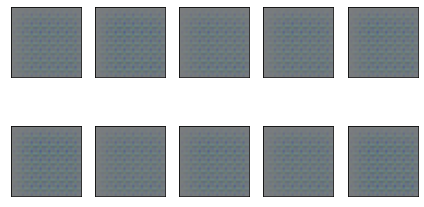

epoch = 2/200, d_loss=0.29432, g_loss=2.95157                                                                                                     
epoch = 3/200, d_loss=0.53069, g_loss=1.16004                                                                                                     
epoch = 4/200, d_loss=0.98106, g_loss=2.61769                                                                                                     
epoch = 5/200, d_loss=0.26795, g_loss=4.54214                                                                                                     
epoch = 6/200, d_loss=0.31168, g_loss=2.33888                                                                                                     
1/1 [==============================] - 0s 21ms/step


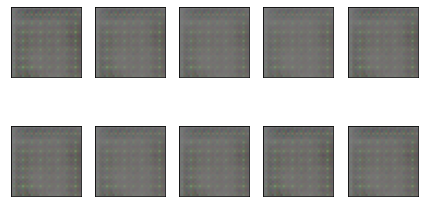

epoch = 7/200, d_loss=0.28531, g_loss=4.22070                                                                                                     
epoch = 8/200, d_loss=0.39622, g_loss=3.36983                                                                                                     
epoch = 9/200, d_loss=0.25824, g_loss=3.68234                                                                                                     
epoch = 10/200, d_loss=0.43324, g_loss=3.82047                                                                                                     
epoch = 11/200, d_loss=0.28011, g_loss=5.14185                                                                                                     
1/1 [==============================] - 0s 33ms/step


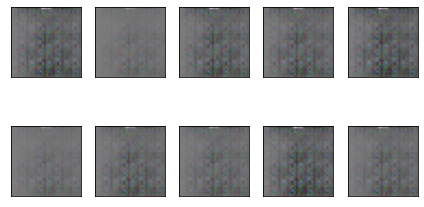

epoch = 12/200, d_loss=0.26818, g_loss=3.51758                                                                                                     
epoch = 13/200, d_loss=0.28220, g_loss=4.19791                                                                                                     
epoch = 14/200, d_loss=0.27795, g_loss=4.16288                                                                                                     
epoch = 15/200, d_loss=0.28076, g_loss=3.44358                                                                                                     
epoch = 16/200, d_loss=0.31755, g_loss=4.97079                                                                                                     
1/1 [==============================] - 0s 19ms/step


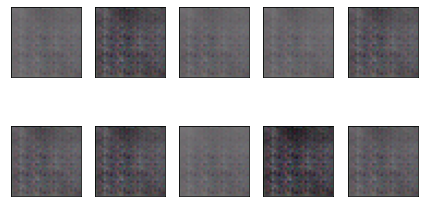

epoch = 17/200, d_loss=0.30875, g_loss=4.29361                                                                                                     
epoch = 18/200, d_loss=0.36791, g_loss=2.34424                                                                                                     
epoch = 19/200, d_loss=0.29124, g_loss=4.69451                                                                                                     
epoch = 20/200, d_loss=0.45198, g_loss=7.36720                                                                                                     
epoch = 21/200, d_loss=0.25357, g_loss=4.91786                                                                                                     
1/1 [==============================] - 0s 19ms/step


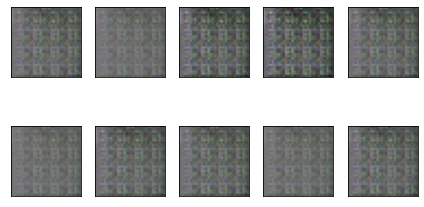

epoch = 22/200, d_loss=0.36506, g_loss=2.77888                                                                                                     
epoch = 23/200, d_loss=0.29949, g_loss=2.52178                                                                                                     
epoch = 24/200, d_loss=0.25694, g_loss=4.88602                                                                                                     
epoch = 25/200, d_loss=0.24332, g_loss=3.75715                                                                                                     
epoch = 26/200, d_loss=0.24048, g_loss=3.84169                                                                                                     
1/1 [==============================] - 0s 22ms/step


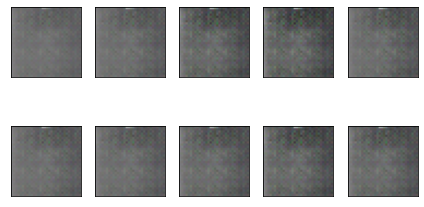

epoch = 27/200, d_loss=0.21995, g_loss=4.35668                                                                                                     
epoch = 28/200, d_loss=0.30818, g_loss=10.94133                                                                                                     
epoch = 29/200, d_loss=0.23783, g_loss=4.89579                                                                                                     
epoch = 30/200, d_loss=0.26110, g_loss=4.38539                                                                                                     
epoch = 31/200, d_loss=0.24420, g_loss=4.59170                                                                                                     
1/1 [==============================] - 0s 20ms/step


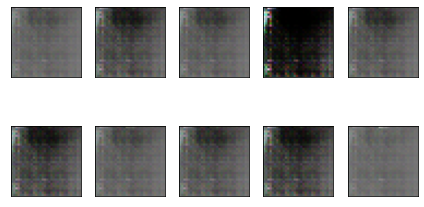

epoch = 32/200, d_loss=0.30355, g_loss=4.78045                                                                                                     
epoch = 33/200, d_loss=0.32351, g_loss=3.54066                                                                                                     
epoch = 34/200, d_loss=0.33510, g_loss=4.32525                                                                                                     
epoch = 35/200, d_loss=0.28345, g_loss=4.27287                                                                                                     
epoch = 36/200, d_loss=0.30619, g_loss=3.35631                                                                                                     
1/1 [==============================] - 0s 22ms/step


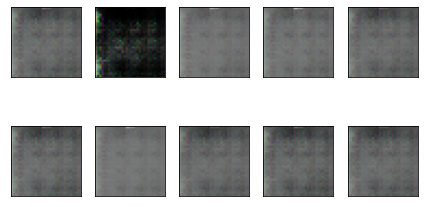

epoch = 37/200, d_loss=0.30391, g_loss=5.72379                                                                                                     
epoch = 38/200, d_loss=0.30475, g_loss=3.86818                                                                                                     
epoch = 39/200, d_loss=0.30524, g_loss=4.14917                                                                                                     
epoch = 40/200, d_loss=0.29343, g_loss=3.89493                                                                                                     
epoch = 41/200, d_loss=0.29937, g_loss=3.91080                                                                                                     
1/1 [==============================] - 0s 21ms/step


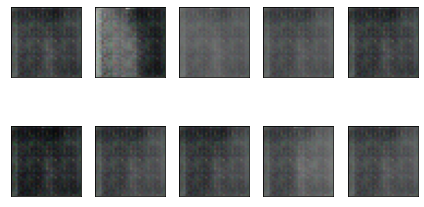

epoch = 42/200, d_loss=0.25118, g_loss=3.59831                                                                                                     
epoch = 43/200, d_loss=0.34096, g_loss=6.87928                                                                                                     
epoch = 44/200, d_loss=0.27484, g_loss=4.49043                                                                                                     
epoch = 45/200, d_loss=0.32869, g_loss=3.77165                                                                                                     
epoch = 46/200, d_loss=0.23898, g_loss=3.84352                                                                                                     
1/1 [==============================] - 0s 19ms/step


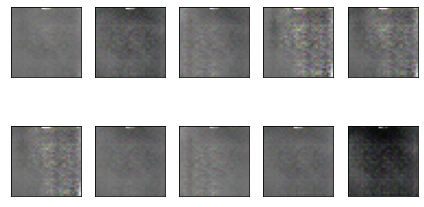

epoch = 47/200, d_loss=0.26738, g_loss=5.53376                                                                                                     
epoch = 48/200, d_loss=0.35751, g_loss=7.41526                                                                                                     
epoch = 49/200, d_loss=0.37234, g_loss=8.83185                                                                                                     
epoch = 50/200, d_loss=0.23789, g_loss=5.74039                                                                                                     
epoch = 51/200, d_loss=0.21539, g_loss=4.56736                                                                                                     
1/1 [==============================] - 0s 21ms/step


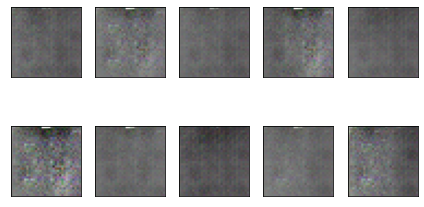

epoch = 52/200, d_loss=0.26332, g_loss=6.34477                                                                                                     
epoch = 53/200, d_loss=0.30503, g_loss=6.01385                                                                                                     
epoch = 54/200, d_loss=0.38934, g_loss=4.62276                                                                                                     
epoch = 55/200, d_loss=0.26401, g_loss=5.80678                                                                                                     
epoch = 56/200, d_loss=0.24517, g_loss=5.63375                                                                                                     
1/1 [==============================] - 0s 31ms/step


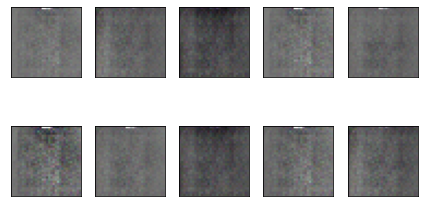

epoch = 57/200, d_loss=0.24310, g_loss=4.92498                                                                                                     
epoch = 58/200, d_loss=0.24678, g_loss=4.81312                                                                                                     
epoch = 59/200, d_loss=0.20825, g_loss=4.84750                                                                                                     
epoch = 60/200, d_loss=0.26623, g_loss=6.91430                                                                                                     
epoch = 61/200, d_loss=0.22591, g_loss=5.77899                                                                                                     
1/1 [==============================] - 0s 20ms/step


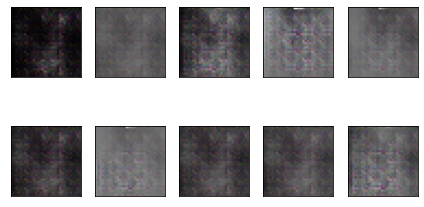

epoch = 62/200, d_loss=0.23245, g_loss=4.52109                                                                                                     
epoch = 63/200, d_loss=0.21272, g_loss=4.86225                                                                                                     
epoch = 64/200, d_loss=0.27960, g_loss=4.91259                                                                                                     
epoch = 65/200, d_loss=0.24037, g_loss=6.95293                                                                                                     
epoch = 66/200, d_loss=0.34291, g_loss=6.90042                                                                                                     
1/1 [==============================] - 0s 24ms/step


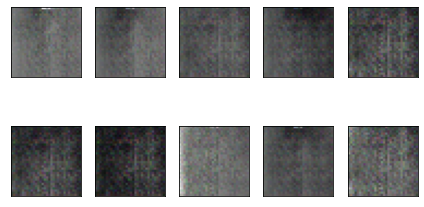

epoch = 67/200, d_loss=0.21192, g_loss=5.22335                                                                                                     
epoch = 68/200, d_loss=0.20577, g_loss=4.94131                                                                                                     
epoch = 69/200, d_loss=0.23989, g_loss=4.98862                                                                                                     
epoch = 70/200, d_loss=0.22406, g_loss=5.01250                                                                                                     
epoch = 71/200, d_loss=0.21411, g_loss=5.46529                                                                                                     
1/1 [==============================] - 0s 21ms/step


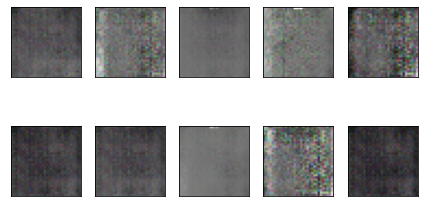

epoch = 72/200, d_loss=0.20211, g_loss=4.92568                                                                                                     
epoch = 73/200, d_loss=0.24851, g_loss=8.04885                                                                                                     
epoch = 74/200, d_loss=0.24281, g_loss=5.07123                                                                                                     
epoch = 75/200, d_loss=0.20832, g_loss=6.49303                                                                                                     
epoch = 76/200, d_loss=0.21729, g_loss=5.66526                                                                                                     
1/1 [==============================] - 0s 30ms/step


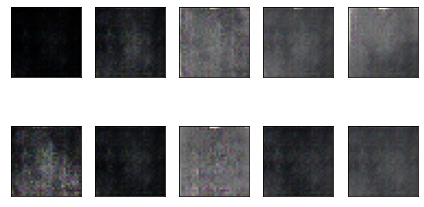

epoch = 77/200, d_loss=0.22482, g_loss=5.30273                                                                                                     
epoch = 78/200, d_loss=0.19319, g_loss=5.42140                                                                                                     
epoch = 79/200, d_loss=0.27551, g_loss=6.99132                                                                                                     
epoch = 80/200, d_loss=0.20541, g_loss=4.53920                                                                                                     
epoch = 81/200, d_loss=0.22690, g_loss=4.26022                                                                                                     
1/1 [==============================] - 0s 23ms/step


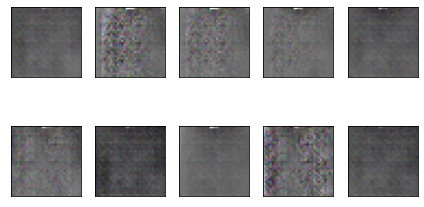

epoch = 82/200, d_loss=0.24993, g_loss=7.28843                                                                                                     
epoch = 83/200, d_loss=0.19584, g_loss=5.59748                                                                                                     
epoch = 84/200, d_loss=0.20774, g_loss=5.66655                                                                                                     
epoch = 85/200, d_loss=0.22821, g_loss=5.12886                                                                                                     
epoch = 86/200, d_loss=0.24217, g_loss=6.66328                                                                                                     
1/1 [==============================] - 0s 30ms/step


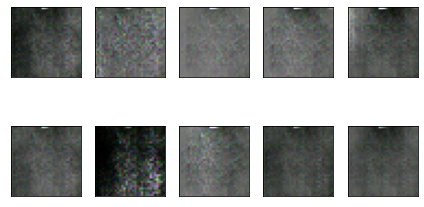

epoch = 87/200, d_loss=0.21703, g_loss=6.29319                                                                                                     
epoch = 88/200, d_loss=0.23898, g_loss=5.15786                                                                                                     
epoch = 89/200, d_loss=0.21027, g_loss=7.02595                                                                                                     
epoch = 90/200, d_loss=0.25880, g_loss=5.12352                                                                                                     
epoch = 91/200, d_loss=0.20883, g_loss=5.72636                                                                                                     
1/1 [==============================] - 0s 44ms/step


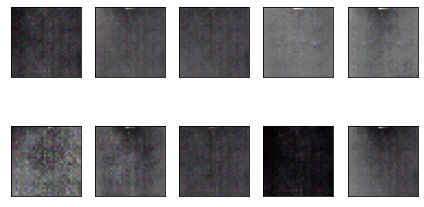

epoch = 92/200, d_loss=0.29173, g_loss=5.87950                                                                                                     
epoch = 93/200, d_loss=0.25772, g_loss=7.26560                                                                                                     
epoch = 94/200, d_loss=0.23110, g_loss=5.11517                                                                                                     
epoch = 95/200, d_loss=0.33759, g_loss=8.35959                                                                                                     
epoch = 96/200, d_loss=0.24274, g_loss=4.74955                                                                                                     
1/1 [==============================] - 0s 64ms/step


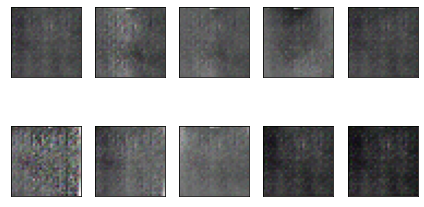

epoch = 97/200, d_loss=0.21915, g_loss=5.46621                                                                                                     
epoch = 98/200, d_loss=0.26307, g_loss=7.90624                                                                                                     
epoch = 99/200, d_loss=0.31134, g_loss=5.32552                                                                                                     
epoch = 100/200, d_loss=0.20864, g_loss=6.64288                                                                                                     
epoch = 101/200, d_loss=0.23985, g_loss=6.79666                                                                                                     
1/1 [==============================] - 0s 20ms/step


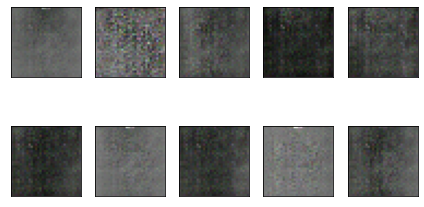

KeyboardInterrupt: ignored

In [ ]:
epochs = 200
batch_size = 64
smooth = 0.1
X_train = discriminator_data
real = np.ones(shape=(batch_size, 1))
fake = np.zeros(shape=(batch_size, 1))
d_loss = []
g_loss = []

for e in range(epochs + 1):
    for i in range(len(X_train) // batch_size):

        # Train Discriminator weights
        discriminator.trainable = True

        # Real samples
        X_batch = X_train[i*batch_size:(i+1)*batch_size]
        d_loss_real = discriminator.train_on_batch(x=X_batch,
                                                   y=real * (1 - smooth))

        # Fake Samples
        z = np.random.normal(loc=0, scale=1, size=(batch_size, latent_dim))
        X_fake = generator.predict_on_batch(z)
        d_loss_fake = discriminator.train_on_batch(x=X_fake, y=fake)

        # Discriminator loss
        d_loss_batch = 0.5 * (d_loss_real[0] + d_loss_fake[0])

        # Train Generator weights
        discriminator.trainable = False
        g_loss_batch = d_g.train_on_batch(x=z, y=real)

        print(
            'epoch = %d/%d, batch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, i, len(X_train) // batch_size, d_loss_batch, g_loss_batch[0]),
            100*' ',
            end='\r'
        )

    d_loss.append(d_loss_batch)
    g_loss.append(g_loss_batch[0])
    print('epoch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, d_loss[-1], g_loss[-1]), 100*' ')

    if e % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))
            #plt.imshow(x_fake[k].astype('uint8'), cmap='gray')

        plt.tight_layout()
        plt.show()

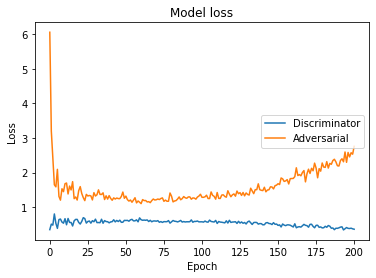

In [ ]:
# plotting the metrics
plt.plot(d_loss)
plt.plot(g_loss)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Discriminator', 'Adversarial'], loc='center right')
plt.show()

Training proposed DCGAN + VAE with Freezed Encoder and without Batch Normalization and with dropout rate = 0.4

In [ ]:
# latent space dimension
latent_dim = 128

init = initializers.RandomNormal(stddev=0.02)

# Generator network
generator = Sequential()

generator.add(Dense(2*2*256, input_shape=(latent_dim,), kernel_initializer=init))
generator.add(Reshape((2, 2, 256)))
generator.add(ReLU())

generator.add(Conv2DTranspose(512, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(256, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(128, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(3, (5, 5), strides=2,padding='same', activation='tanh'))
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 1024)              132096    
                                                                 
 reshape_1 (Reshape)         (None, 2, 2, 256)         0         
                                                                 
 re_lu (ReLU)                (None, 2, 2, 256)         0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 4, 4, 512)        3277312   
 ranspose)                                                       
                                                                 
 re_lu_1 (ReLU)              (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 8, 8, 256)        3277056   
 ranspose)                                              

In [ ]:
# imagem shape 32x32x3
img_shape = discriminator_data[0].shape

# Discriminator network
discriminator = Sequential()

discriminator.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same',
                         input_shape=(img_shape), kernel_initializer=init))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

# FC
discriminator.add(Flatten())
discriminator.add(Dropout(0.4))
# Output
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 16, 16, 128)       9728      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16, 16, 128)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 256)         819456    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 256)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 512)         3277312   
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_6 (Conv2D)           (None, 2, 2, 1024)       

/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [ ]:
discriminator.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
                      metrics=['accuracy'])

In [ ]:
discriminator.trainable = False

z = Input(shape=(latent_dim,))
img = generator(z)
decision = discriminator(img)
d_g = Model(inputs=z, outputs=decision)

d_g.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
            metrics=['accuracy'])

In [ ]:
d_g.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128)]             0         
                                                                 
 sequential (Sequential)     (None, 32, 32, 3)         7515395   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 17218817  
                                                                 
Total params: 24,734,212
Trainable params: 7,515,395
Non-trainable params: 17,218,817
_________________________________________________________________


2/2 [==============================] - 0s 10ms/step
epoch = 1/600, d_loss=0.72992, g_loss=7.22892                                                                                                     
1/1 [==============================] - 0s 174ms/step


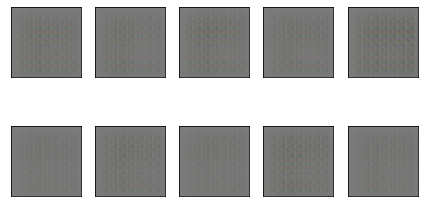

2/2 [==============================] - 0s 9ms/step
epoch = 2/600, d_loss=0.57561, g_loss=2.97687                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 3/600, d_loss=0.36583, g_loss=4.71474                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 4/600, d_loss=0.26694, g_loss=4.46911                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 5/600, d_loss=0.26168, g_loss=4.05851                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 6/600, d_loss=0.29198, g_loss=2.35200                                                                                                     
1/1 [====

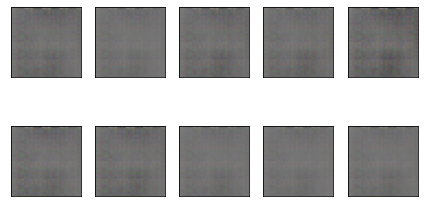

2/2 [==============================] - 0s 10ms/step
epoch = 7/600, d_loss=0.27049, g_loss=4.41947                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 8/600, d_loss=0.28737, g_loss=3.84677                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 9/600, d_loss=0.24698, g_loss=4.09542                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 10/600, d_loss=0.25538, g_loss=5.26106                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 11/600, d_loss=0.33130, g_loss=4.35073                                                                                                     
1/1 [=

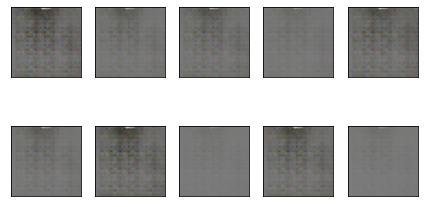

2/2 [==============================] - 0s 9ms/step
epoch = 12/600, d_loss=0.24767, g_loss=3.07775                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 13/600, d_loss=0.24929, g_loss=3.72592                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 14/600, d_loss=0.24101, g_loss=4.99502                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 15/600, d_loss=0.29591, g_loss=4.33635                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 16/600, d_loss=0.27222, g_loss=5.77073                                                                                                     
1

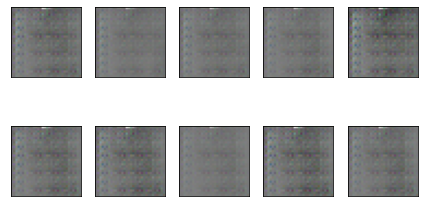

2/2 [==============================] - 0s 9ms/step
epoch = 17/600, d_loss=0.26512, g_loss=5.17873                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 18/600, d_loss=0.28770, g_loss=5.47576                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 19/600, d_loss=0.79194, g_loss=13.62666                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 20/600, d_loss=0.31844, g_loss=3.92627                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 21/600, d_loss=0.33118, g_loss=7.37490                                                                                                     


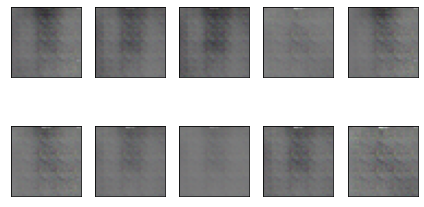

2/2 [==============================] - 0s 11ms/step
epoch = 22/600, d_loss=0.36613, g_loss=2.97090                                                                                                     
2/2 [==============================] - 0s 21ms/step
epoch = 23/600, d_loss=0.24294, g_loss=3.42699                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 24/600, d_loss=0.28828, g_loss=3.21806                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 25/600, d_loss=0.33253, g_loss=3.44521                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 26/600, d_loss=0.28393, g_loss=5.19086                                                                                                     


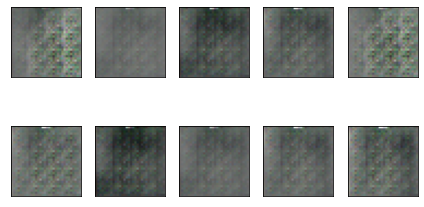

2/2 [==============================] - 0s 9ms/step
epoch = 27/600, d_loss=0.28090, g_loss=3.63704                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 28/600, d_loss=0.28591, g_loss=4.63197                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 29/600, d_loss=0.43256, g_loss=7.61214                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 30/600, d_loss=0.35302, g_loss=3.25842                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 31/600, d_loss=0.23750, g_loss=3.61327                                                                                                     
1/

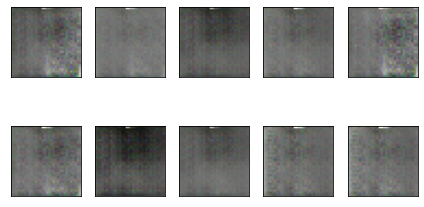

2/2 [==============================] - 0s 13ms/step
epoch = 32/600, d_loss=0.31838, g_loss=4.77630                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 33/600, d_loss=0.24336, g_loss=3.72014                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 34/600, d_loss=0.34007, g_loss=3.85176                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 35/600, d_loss=0.24659, g_loss=4.72161                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 36/600, d_loss=0.28144, g_loss=4.22365                                                                                                     


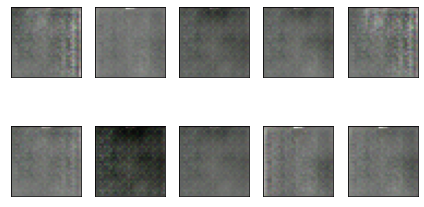

2/2 [==============================] - 0s 9ms/step
epoch = 37/600, d_loss=0.26694, g_loss=4.52994                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 38/600, d_loss=0.35395, g_loss=3.40024                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 39/600, d_loss=0.22216, g_loss=4.08891                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 40/600, d_loss=0.30264, g_loss=3.20104                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 41/600, d_loss=0.30112, g_loss=6.10862                                                                                                     
1

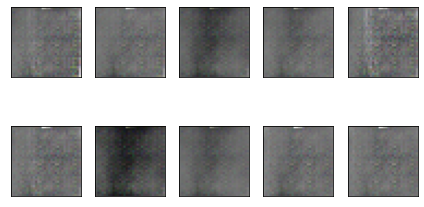

2/2 [==============================] - 0s 15ms/step
epoch = 42/600, d_loss=0.38583, g_loss=4.88588                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 43/600, d_loss=0.32514, g_loss=4.47815                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 44/600, d_loss=0.36640, g_loss=3.71894                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 45/600, d_loss=0.33655, g_loss=5.13765                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 46/600, d_loss=0.26243, g_loss=3.83957                                                                                                     


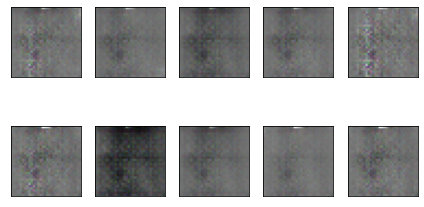

2/2 [==============================] - 0s 13ms/step
epoch = 47/600, d_loss=0.33574, g_loss=5.46385                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 48/600, d_loss=0.27566, g_loss=4.47248                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 49/600, d_loss=0.26315, g_loss=3.88762                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 50/600, d_loss=0.25026, g_loss=4.18614                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 51/600, d_loss=0.39639, g_loss=4.65866                                                                                                     


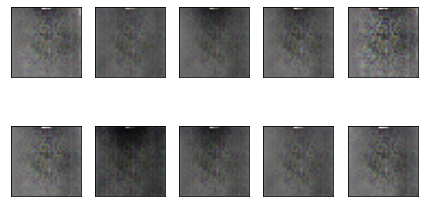

2/2 [==============================] - 0s 12ms/step
epoch = 52/600, d_loss=0.24028, g_loss=4.74574                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 53/600, d_loss=0.22278, g_loss=6.22445                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 54/600, d_loss=0.68172, g_loss=6.71308                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 55/600, d_loss=0.57733, g_loss=6.35626                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 56/600, d_loss=0.22929, g_loss=4.85833                                                                                                     
1

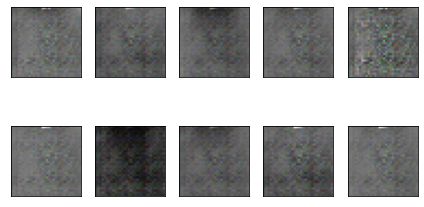

2/2 [==============================] - 0s 22ms/step
epoch = 57/600, d_loss=0.47780, g_loss=5.35852                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 58/600, d_loss=0.48475, g_loss=8.15947                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 59/600, d_loss=0.25811, g_loss=6.37925                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 60/600, d_loss=0.38978, g_loss=7.43618                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 61/600, d_loss=0.47473, g_loss=8.78727                                                                                                     
1

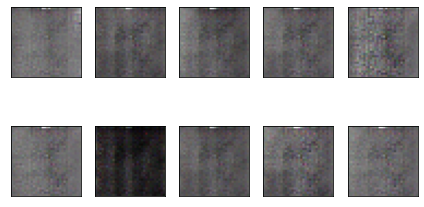

2/2 [==============================] - 0s 12ms/step
epoch = 62/600, d_loss=0.25223, g_loss=6.00692                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 63/600, d_loss=0.24361, g_loss=4.63266                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 64/600, d_loss=0.26111, g_loss=4.56882                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 65/600, d_loss=0.67121, g_loss=11.05564                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 66/600, d_loss=0.40743, g_loss=8.51301                                                                                                     

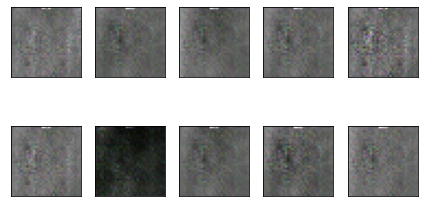

2/2 [==============================] - 0s 10ms/step
epoch = 67/600, d_loss=0.35256, g_loss=5.50622                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 68/600, d_loss=0.32478, g_loss=7.06851                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 69/600, d_loss=0.49872, g_loss=8.75795                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 70/600, d_loss=0.48278, g_loss=9.95687                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 71/600, d_loss=0.33269, g_loss=6.18929                                                                                                     


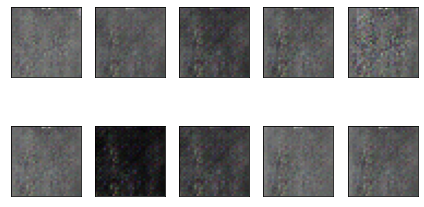

2/2 [==============================] - 0s 15ms/step
epoch = 72/600, d_loss=0.26537, g_loss=5.05544                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 73/600, d_loss=0.30104, g_loss=4.58488                                                                                                     
2/2 [==============================] - 0s 18ms/step
epoch = 74/600, d_loss=0.47372, g_loss=8.24844                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 75/600, d_loss=0.34252, g_loss=5.37848                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 76/600, d_loss=0.27050, g_loss=5.02731                                                                                                     


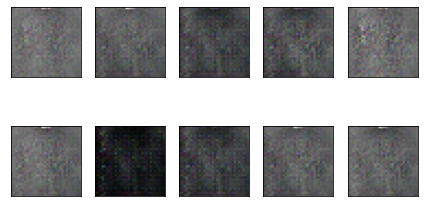

2/2 [==============================] - 0s 16ms/step
epoch = 77/600, d_loss=0.22421, g_loss=4.70271                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 78/600, d_loss=0.34447, g_loss=5.71475                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 79/600, d_loss=0.28156, g_loss=4.48128                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 80/600, d_loss=0.39222, g_loss=7.47689                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 81/600, d_loss=0.36817, g_loss=6.66734                                                                                                     


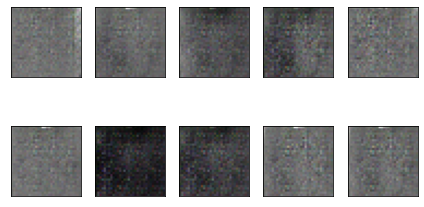

2/2 [==============================] - 0s 13ms/step
epoch = 82/600, d_loss=0.40039, g_loss=7.37378                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 83/600, d_loss=0.32347, g_loss=4.94108                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 84/600, d_loss=0.37723, g_loss=5.26848                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 85/600, d_loss=0.26913, g_loss=5.09833                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 86/600, d_loss=0.41221, g_loss=6.01169                                                                                                     


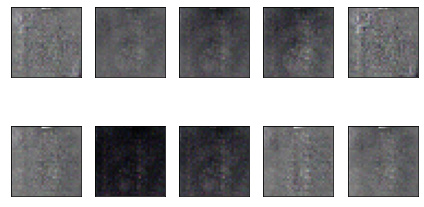

2/2 [==============================] - 0s 13ms/step
epoch = 87/600, d_loss=0.28171, g_loss=4.45271                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 88/600, d_loss=0.21016, g_loss=4.70925                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 89/600, d_loss=0.24934, g_loss=5.38749                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 90/600, d_loss=0.47374, g_loss=6.70616                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 91/600, d_loss=0.22286, g_loss=4.92206                                                                                                     


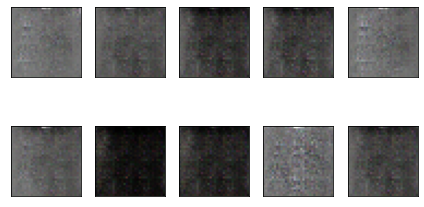

2/2 [==============================] - 0s 13ms/step
epoch = 92/600, d_loss=0.22366, g_loss=5.18659                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 93/600, d_loss=0.36615, g_loss=6.82626                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 94/600, d_loss=0.30244, g_loss=4.64385                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 95/600, d_loss=0.40387, g_loss=8.91646                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 96/600, d_loss=0.28316, g_loss=5.57363                                                                                                     
1

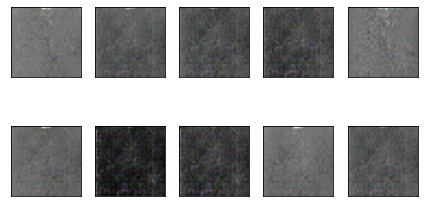

2/2 [==============================] - 0s 16ms/step
epoch = 97/600, d_loss=0.22939, g_loss=4.96029                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 98/600, d_loss=0.24591, g_loss=5.11165                                                                                                     
2/2 [==============================] - 0s 20ms/step
epoch = 99/600, d_loss=0.20700, g_loss=5.03971                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 100/600, d_loss=0.32853, g_loss=6.54979                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 101/600, d_loss=0.25721, g_loss=5.54731                                                                                                    

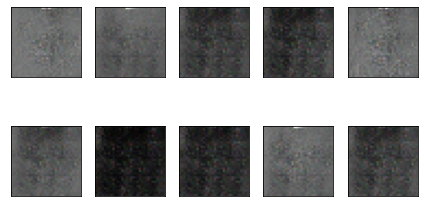

2/2 [==============================] - 0s 20ms/step
epoch = 102/600, d_loss=0.27509, g_loss=7.65691                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 103/600, d_loss=0.33077, g_loss=4.67472                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 104/600, d_loss=0.47591, g_loss=4.37311                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 105/600, d_loss=0.26148, g_loss=4.86315                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 106/600, d_loss=0.23649, g_loss=4.79291                                                                                                 

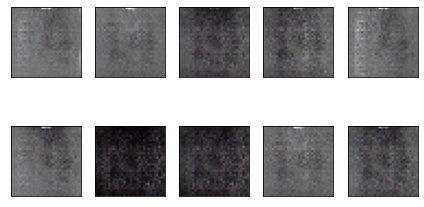

2/2 [==============================] - 0s 11ms/step
epoch = 107/600, d_loss=0.29905, g_loss=5.50173                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 108/600, d_loss=0.27612, g_loss=4.74503                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 109/600, d_loss=0.34746, g_loss=7.09069                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 110/600, d_loss=0.25685, g_loss=6.23142                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 111/600, d_loss=0.32411, g_loss=6.47212                                                                                                 

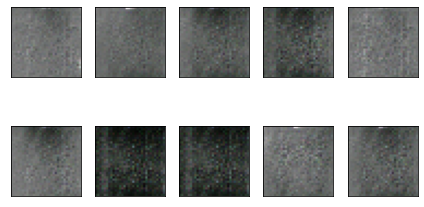

2/2 [==============================] - 0s 11ms/step
epoch = 112/600, d_loss=0.50134, g_loss=6.36270                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 113/600, d_loss=0.30127, g_loss=6.88357                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 114/600, d_loss=0.24589, g_loss=6.04283                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 115/600, d_loss=0.28646, g_loss=5.54207                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 116/600, d_loss=0.26473, g_loss=5.43132                                                                                                 

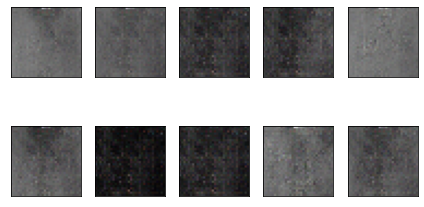

2/2 [==============================] - 0s 13ms/step
epoch = 117/600, d_loss=0.23487, g_loss=5.93683                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 118/600, d_loss=0.24911, g_loss=4.78031                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 119/600, d_loss=0.24028, g_loss=4.51677                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 120/600, d_loss=0.30627, g_loss=5.09453                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 121/600, d_loss=0.29656, g_loss=5.93293                                                                                                 

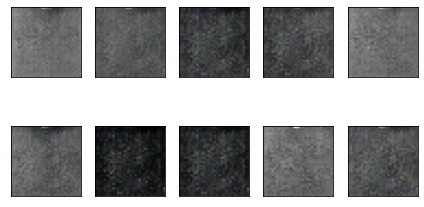

2/2 [==============================] - 0s 17ms/step
epoch = 122/600, d_loss=0.24010, g_loss=4.86411                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 123/600, d_loss=0.26604, g_loss=6.25560                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 124/600, d_loss=0.31233, g_loss=5.18974                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 125/600, d_loss=0.25257, g_loss=4.54946                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 126/600, d_loss=0.21760, g_loss=4.76672                                                                                                 

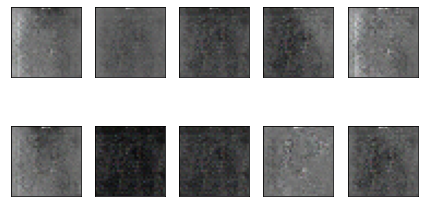

2/2 [==============================] - 0s 15ms/step
epoch = 127/600, d_loss=0.28748, g_loss=5.53353                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 128/600, d_loss=0.24030, g_loss=5.08531                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 129/600, d_loss=0.29451, g_loss=6.59352                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 130/600, d_loss=0.23535, g_loss=5.20924                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 131/600, d_loss=0.25524, g_loss=4.97588                                                                                                 

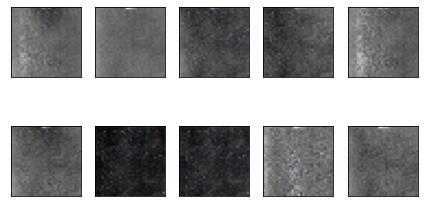

2/2 [==============================] - 0s 10ms/step
epoch = 132/600, d_loss=0.25234, g_loss=4.74927                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 133/600, d_loss=0.25264, g_loss=5.51573                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 134/600, d_loss=0.23859, g_loss=6.15302                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 135/600, d_loss=0.30556, g_loss=6.42737                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 136/600, d_loss=0.21551, g_loss=5.51798                                                                                                  

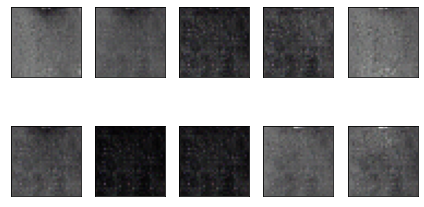

2/2 [==============================] - 0s 12ms/step
epoch = 137/600, d_loss=0.24588, g_loss=6.48776                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 138/600, d_loss=0.30680, g_loss=5.94592                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 139/600, d_loss=0.24203, g_loss=5.33506                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 140/600, d_loss=0.40571, g_loss=9.78458                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 141/600, d_loss=0.31743, g_loss=5.32491                                                                                                  

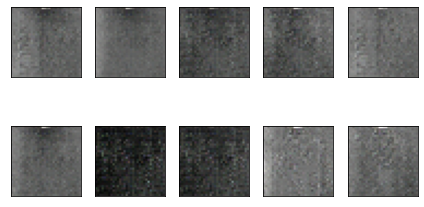

2/2 [==============================] - 0s 11ms/step
epoch = 142/600, d_loss=0.26177, g_loss=5.33512                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 143/600, d_loss=0.35853, g_loss=8.89108                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 144/600, d_loss=0.30752, g_loss=6.71770                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 145/600, d_loss=0.30298, g_loss=5.05393                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 146/600, d_loss=0.36100, g_loss=6.96199                                                                                                 

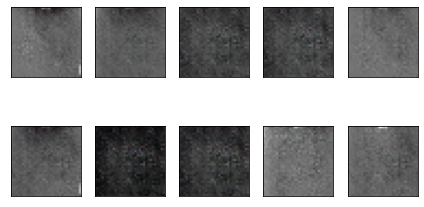

2/2 [==============================] - 0s 13ms/step
epoch = 147/600, d_loss=0.25126, g_loss=8.42198                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 148/600, d_loss=0.23601, g_loss=4.84750                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 149/600, d_loss=0.30617, g_loss=7.88091                                                                                                     
2/2 [==============================] - 0s 18ms/step
epoch = 150/600, d_loss=0.38637, g_loss=6.69136                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 151/600, d_loss=0.35636, g_loss=7.64279                                                                                                 

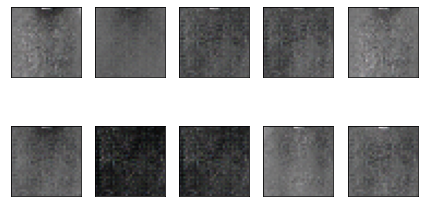

2/2 [==============================] - 0s 17ms/step
epoch = 152/600, d_loss=0.26822, g_loss=5.67401                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 153/600, d_loss=0.28192, g_loss=5.52145                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 154/600, d_loss=0.35618, g_loss=7.80995                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 155/600, d_loss=0.27831, g_loss=6.01900                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 156/600, d_loss=0.21113, g_loss=5.77379                                                                                                 

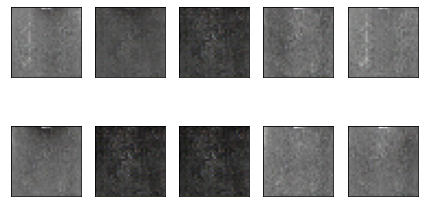

2/2 [==============================] - 0s 16ms/step
epoch = 157/600, d_loss=0.22061, g_loss=5.66317                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 158/600, d_loss=0.29949, g_loss=6.65276                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 159/600, d_loss=0.26531, g_loss=7.31828                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 160/600, d_loss=0.42953, g_loss=10.42538                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 161/600, d_loss=0.39011, g_loss=7.95607                                                                                                

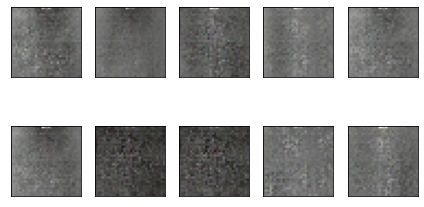

2/2 [==============================] - 0s 11ms/step
epoch = 162/600, d_loss=0.24848, g_loss=5.81958                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 163/600, d_loss=0.25591, g_loss=5.99779                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 164/600, d_loss=0.31959, g_loss=6.06888                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 165/600, d_loss=0.32048, g_loss=7.26730                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 166/600, d_loss=0.28593, g_loss=7.37150                                                                                                 

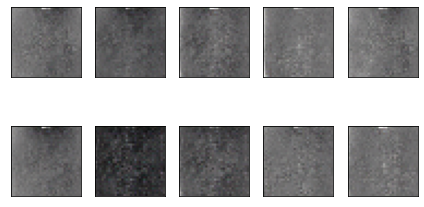

2/2 [==============================] - 0s 14ms/step
epoch = 167/600, d_loss=0.23464, g_loss=6.12346                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 168/600, d_loss=0.29474, g_loss=6.65009                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 169/600, d_loss=0.32532, g_loss=9.40120                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 170/600, d_loss=0.34196, g_loss=7.20651                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 171/600, d_loss=0.29130, g_loss=8.06530                                                                                                 

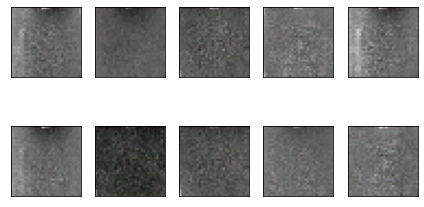

2/2 [==============================] - 0s 15ms/step
epoch = 172/600, d_loss=0.32663, g_loss=6.76698                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 173/600, d_loss=0.23765, g_loss=6.02576                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 174/600, d_loss=0.29575, g_loss=9.05357                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 175/600, d_loss=0.23623, g_loss=5.25608                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 176/600, d_loss=0.24873, g_loss=5.09172                                                                                                 

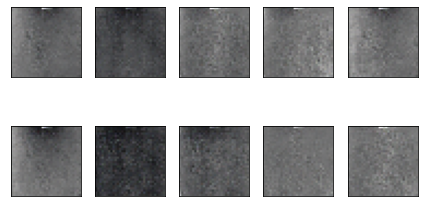

2/2 [==============================] - 0s 14ms/step
epoch = 177/600, d_loss=0.29040, g_loss=6.04379                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 178/600, d_loss=0.33697, g_loss=7.13379                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 179/600, d_loss=0.22710, g_loss=5.68468                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 180/600, d_loss=0.34629, g_loss=7.29271                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 181/600, d_loss=0.27362, g_loss=6.01928                                                                                                 

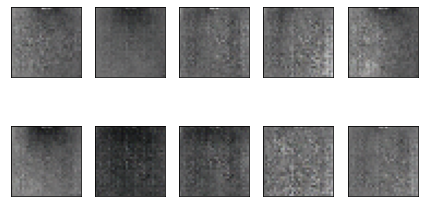

2/2 [==============================] - 0s 16ms/step
epoch = 182/600, d_loss=0.27060, g_loss=9.26263                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 183/600, d_loss=0.35302, g_loss=8.99071                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 184/600, d_loss=0.37075, g_loss=7.77494                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 185/600, d_loss=0.23105, g_loss=6.70882                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 186/600, d_loss=0.37939, g_loss=8.14831                                                                                                 

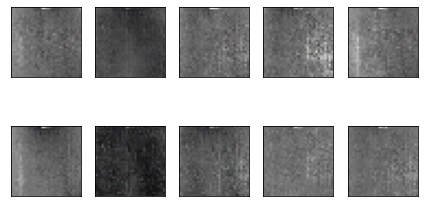

2/2 [==============================] - 0s 15ms/step
epoch = 187/600, d_loss=0.23165, g_loss=6.58624                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 188/600, d_loss=0.30390, g_loss=6.60476                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 189/600, d_loss=0.22885, g_loss=5.92870                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 190/600, d_loss=0.38377, g_loss=8.40346                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 191/600, d_loss=0.23680, g_loss=6.12080                                                                                                 

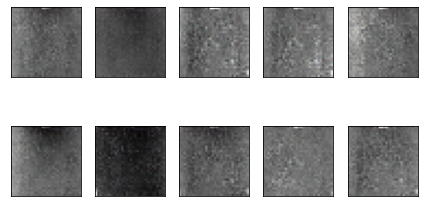

2/2 [==============================] - 0s 16ms/step
epoch = 192/600, d_loss=0.22117, g_loss=5.77312                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 193/600, d_loss=0.25006, g_loss=6.74289                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 194/600, d_loss=0.42715, g_loss=9.53326                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 195/600, d_loss=0.28130, g_loss=7.16598                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 196/600, d_loss=0.46659, g_loss=11.59394                                                                                                

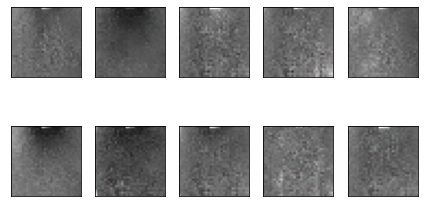

2/2 [==============================] - 0s 11ms/step
epoch = 197/600, d_loss=0.25774, g_loss=5.45069                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 198/600, d_loss=0.27206, g_loss=5.04576                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 199/600, d_loss=0.28755, g_loss=6.06728                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 200/600, d_loss=0.23975, g_loss=7.63171                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 201/600, d_loss=0.24655, g_loss=5.95131                                                                                                  

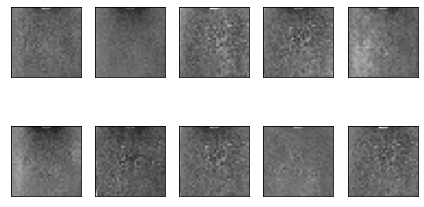

2/2 [==============================] - 0s 11ms/step
epoch = 202/600, d_loss=0.23838, g_loss=5.28345                                                                                                     
2/2 [==============================] - 0s 8ms/step
epoch = 203/600, d_loss=0.26197, g_loss=5.90875                                                                                                     
2/2 [==============================] - 0s 20ms/step
epoch = 204/600, d_loss=0.28890, g_loss=5.80912                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 205/600, d_loss=0.25053, g_loss=6.96623                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 206/600, d_loss=0.33502, g_loss=8.17135                                                                                                  

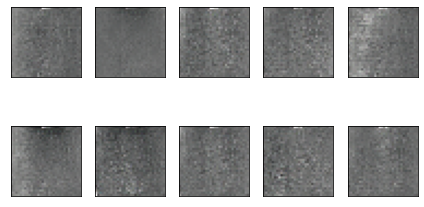

2/2 [==============================] - 0s 11ms/step
epoch = 207/600, d_loss=0.22772, g_loss=5.71811                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 208/600, d_loss=0.27402, g_loss=6.64126                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 209/600, d_loss=0.35971, g_loss=9.76694                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 210/600, d_loss=0.25614, g_loss=6.11372                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 211/600, d_loss=0.25386, g_loss=6.50970                                                                                                 

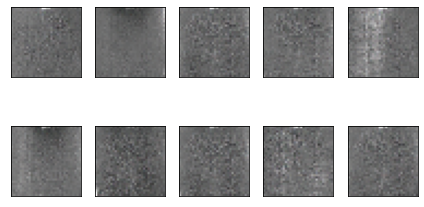

2/2 [==============================] - 0s 11ms/step
epoch = 212/600, d_loss=0.34109, g_loss=7.49273                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 213/600, d_loss=0.26141, g_loss=6.10346                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 214/600, d_loss=0.25286, g_loss=5.58570                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 215/600, d_loss=0.23220, g_loss=8.52586                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 216/600, d_loss=0.29987, g_loss=7.23935                                                                                                  

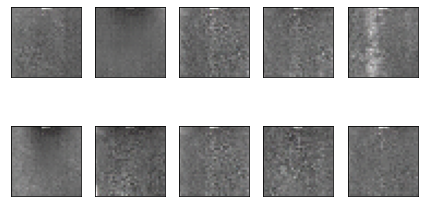

2/2 [==============================] - 0s 11ms/step
epoch = 217/600, d_loss=0.23864, g_loss=5.77433                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 218/600, d_loss=0.22584, g_loss=6.76553                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 219/600, d_loss=0.23182, g_loss=6.33869                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 220/600, d_loss=0.25730, g_loss=6.20926                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 221/600, d_loss=0.39438, g_loss=10.81608                                                                                                 

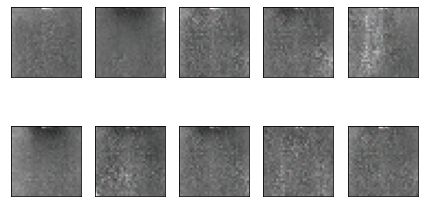

2/2 [==============================] - 0s 10ms/step
epoch = 222/600, d_loss=0.23613, g_loss=8.56650                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 223/600, d_loss=0.24898, g_loss=6.14064                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 224/600, d_loss=0.24455, g_loss=7.29941                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 225/600, d_loss=0.36121, g_loss=8.45449                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 226/600, d_loss=0.30128, g_loss=7.28605                                                                                                  

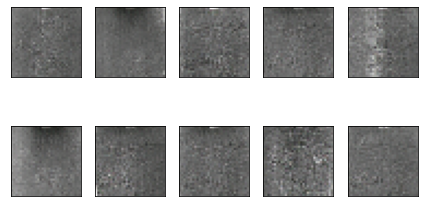

2/2 [==============================] - 0s 13ms/step
epoch = 227/600, d_loss=0.24397, g_loss=5.50354                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 228/600, d_loss=0.25957, g_loss=6.39972                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 229/600, d_loss=0.42621, g_loss=9.41781                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 230/600, d_loss=0.25862, g_loss=6.63960                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 231/600, d_loss=0.25346, g_loss=6.24230                                                                                                   

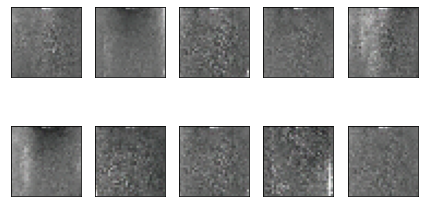

2/2 [==============================] - 0s 9ms/step
epoch = 232/600, d_loss=0.22660, g_loss=5.73324                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 233/600, d_loss=0.27237, g_loss=5.99225                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 234/600, d_loss=0.31351, g_loss=7.44926                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 235/600, d_loss=0.25265, g_loss=7.13382                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 236/600, d_loss=0.31945, g_loss=9.42723                                                                                                   

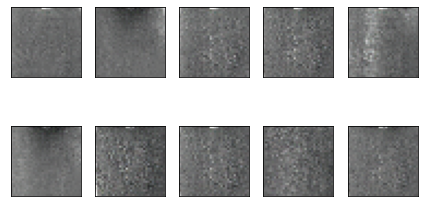

2/2 [==============================] - 0s 9ms/step
epoch = 237/600, d_loss=0.25463, g_loss=6.28266                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 238/600, d_loss=0.27667, g_loss=6.52860                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 239/600, d_loss=0.21717, g_loss=6.25639                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 240/600, d_loss=0.25996, g_loss=7.04051                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 241/600, d_loss=0.27093, g_loss=6.88338                                                                                                  

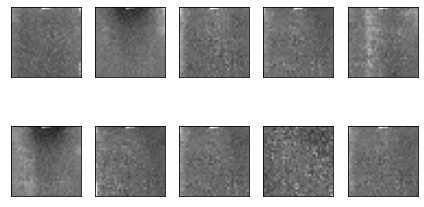

2/2 [==============================] - 0s 11ms/step
epoch = 242/600, d_loss=0.22987, g_loss=6.21909                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 243/600, d_loss=0.24751, g_loss=7.42564                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 244/600, d_loss=0.22709, g_loss=6.44082                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 245/600, d_loss=0.25462, g_loss=6.27243                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 246/600, d_loss=0.21945, g_loss=5.93002                                                                                                 

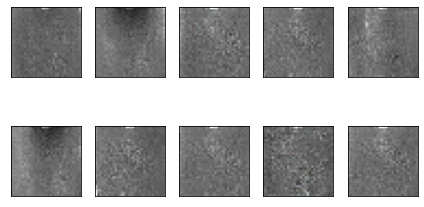

2/2 [==============================] - 0s 10ms/step
epoch = 247/600, d_loss=0.21460, g_loss=5.99994                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 248/600, d_loss=0.29455, g_loss=7.96061                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 249/600, d_loss=0.26768, g_loss=7.53407                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 250/600, d_loss=0.31241, g_loss=8.10275                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 251/600, d_loss=0.25603, g_loss=6.62990                                                                                                 

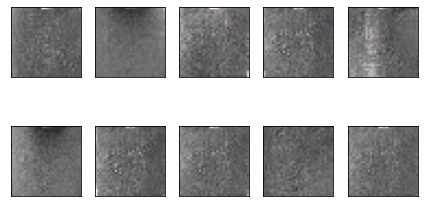

2/2 [==============================] - 0s 12ms/step
epoch = 252/600, d_loss=0.33514, g_loss=10.58057                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 253/600, d_loss=0.26922, g_loss=6.85041                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 254/600, d_loss=0.24299, g_loss=5.52815                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 255/600, d_loss=0.28675, g_loss=7.22392                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 256/600, d_loss=0.27755, g_loss=7.31936                                                                                                

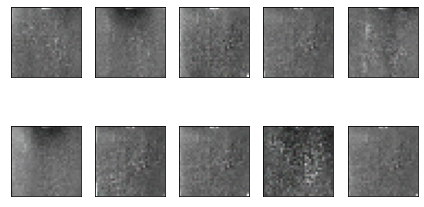

2/2 [==============================] - 0s 11ms/step
epoch = 257/600, d_loss=0.22686, g_loss=6.48709                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 258/600, d_loss=0.30265, g_loss=10.90373                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 259/600, d_loss=0.23549, g_loss=6.67802                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 260/600, d_loss=0.24669, g_loss=7.58965                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 261/600, d_loss=0.23417, g_loss=6.88032                                                                                                

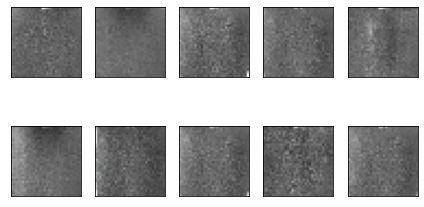

2/2 [==============================] - 0s 10ms/step
epoch = 262/600, d_loss=0.25655, g_loss=7.06398                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 263/600, d_loss=0.28311, g_loss=6.42804                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 264/600, d_loss=0.27836, g_loss=7.18226                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 265/600, d_loss=0.27103, g_loss=6.38724                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 266/600, d_loss=0.22987, g_loss=6.60253                                                                                                 

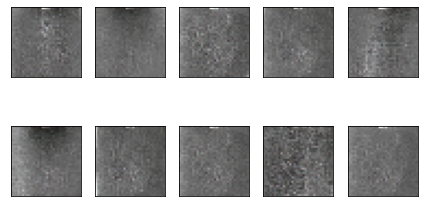

2/2 [==============================] - 0s 15ms/step
epoch = 267/600, d_loss=0.34308, g_loss=7.73296                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 268/600, d_loss=0.22919, g_loss=6.87704                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 269/600, d_loss=0.22054, g_loss=5.82418                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 270/600, d_loss=0.21737, g_loss=5.67262                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 271/600, d_loss=0.24347, g_loss=5.97451                                                                                                 

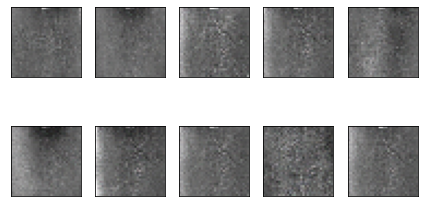

2/2 [==============================] - 0s 11ms/step
epoch = 272/600, d_loss=0.21647, g_loss=5.59097                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 273/600, d_loss=0.26207, g_loss=6.57308                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 274/600, d_loss=0.24680, g_loss=6.26815                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 275/600, d_loss=0.27789, g_loss=9.36934                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 276/600, d_loss=0.25347, g_loss=7.59351                                                                                                 

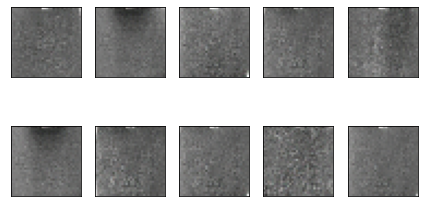

2/2 [==============================] - 0s 12ms/step
epoch = 277/600, d_loss=0.22560, g_loss=5.83346                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 278/600, d_loss=0.26042, g_loss=8.28959                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 279/600, d_loss=0.23435, g_loss=6.14146                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 280/600, d_loss=0.30772, g_loss=7.00093                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 281/600, d_loss=0.23596, g_loss=6.34122                                                                                                 

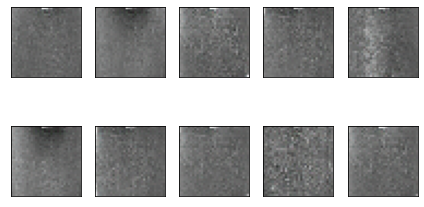

2/2 [==============================] - 0s 10ms/step
epoch = 282/600, d_loss=0.25363, g_loss=7.58049                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 283/600, d_loss=0.20948, g_loss=6.11285                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 284/600, d_loss=0.24815, g_loss=8.08214                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 285/600, d_loss=0.23223, g_loss=7.11756                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 286/600, d_loss=0.23311, g_loss=6.36942                                                                                                 

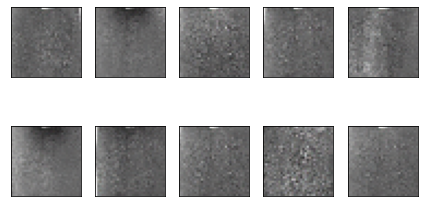

2/2 [==============================] - 0s 19ms/step
epoch = 287/600, d_loss=0.19884, g_loss=7.18444                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 288/600, d_loss=0.20471, g_loss=6.08724                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 289/600, d_loss=0.30514, g_loss=8.19955                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 290/600, d_loss=0.23265, g_loss=6.41396                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 291/600, d_loss=0.22214, g_loss=6.51974                                                                                                  

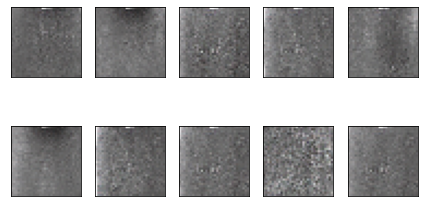

2/2 [==============================] - 0s 10ms/step
epoch = 292/600, d_loss=0.41719, g_loss=2.40081                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 293/600, d_loss=0.45347, g_loss=5.17397                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 294/600, d_loss=0.29611, g_loss=3.45360                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 295/600, d_loss=0.34542, g_loss=4.80920                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 296/600, d_loss=0.31846, g_loss=5.12153                                                                                                  

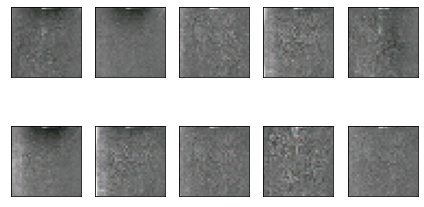

2/2 [==============================] - 0s 10ms/step
epoch = 297/600, d_loss=0.29348, g_loss=5.44352                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 298/600, d_loss=0.24409, g_loss=4.49376                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 299/600, d_loss=0.26771, g_loss=4.97664                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 300/600, d_loss=0.27466, g_loss=4.54942                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 301/600, d_loss=0.25541, g_loss=4.79277                                                                                                 

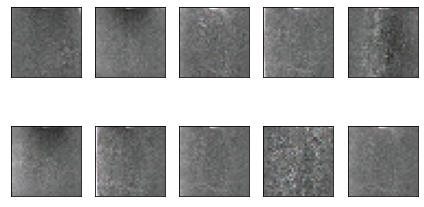

2/2 [==============================] - 0s 13ms/step
epoch = 302/600, d_loss=0.24314, g_loss=4.91656                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 303/600, d_loss=0.25357, g_loss=4.58123                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 304/600, d_loss=0.26317, g_loss=4.63356                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 305/600, d_loss=0.26464, g_loss=4.90410                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 306/600, d_loss=0.23460, g_loss=4.92536                                                                                                 

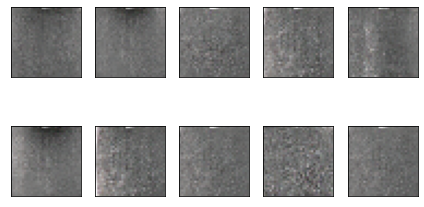

2/2 [==============================] - 0s 10ms/step
epoch = 307/600, d_loss=0.25579, g_loss=4.93542                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 308/600, d_loss=0.27691, g_loss=6.20854                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 309/600, d_loss=0.24894, g_loss=5.63671                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 310/600, d_loss=0.26771, g_loss=5.48220                                                                                                     
2/2 [==============================] - 0s 18ms/step
epoch = 311/600, d_loss=0.26042, g_loss=5.59817                                                                                                 

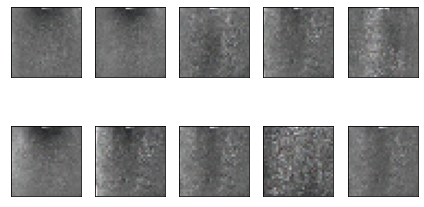

2/2 [==============================] - 0s 10ms/step
epoch = 312/600, d_loss=0.25392, g_loss=5.75138                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 313/600, d_loss=0.23260, g_loss=5.09893                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 314/600, d_loss=0.24162, g_loss=5.77525                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 315/600, d_loss=0.22109, g_loss=5.59601                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 316/600, d_loss=0.22710, g_loss=5.43664                                                                                                 

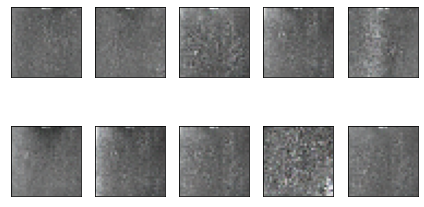

2/2 [==============================] - 0s 14ms/step
epoch = 317/600, d_loss=0.22077, g_loss=5.58474                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 318/600, d_loss=0.23623, g_loss=5.90701                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 319/600, d_loss=0.21886, g_loss=5.22153                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 320/600, d_loss=0.30294, g_loss=6.43090                                                                                                     
2/2 [==============================] - 0s 21ms/step
epoch = 321/600, d_loss=0.23030, g_loss=5.63278                                                                                                  

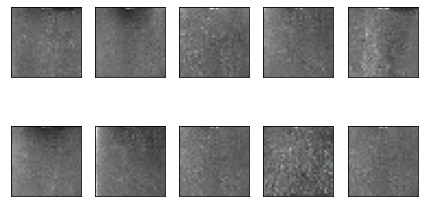

2/2 [==============================] - 0s 10ms/step
epoch = 322/600, d_loss=0.20246, g_loss=6.48244                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 323/600, d_loss=0.21240, g_loss=5.38191                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 324/600, d_loss=0.23547, g_loss=6.32719                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 325/600, d_loss=0.21015, g_loss=5.83451                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 326/600, d_loss=0.23315, g_loss=5.28917                                                                                                 

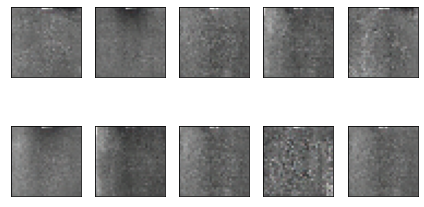

2/2 [==============================] - 0s 9ms/step
epoch = 327/600, d_loss=0.25955, g_loss=6.54004                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 328/600, d_loss=0.22685, g_loss=5.54335                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 329/600, d_loss=0.22095, g_loss=5.97282                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 330/600, d_loss=0.24875, g_loss=6.18899                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 331/600, d_loss=0.21133, g_loss=5.87488                                                                                                  

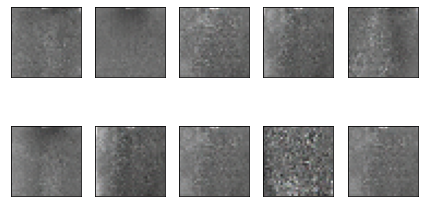

2/2 [==============================] - 0s 14ms/step
epoch = 332/600, d_loss=0.28443, g_loss=7.47948                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 333/600, d_loss=0.22522, g_loss=6.03397                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 334/600, d_loss=0.20345, g_loss=6.95845                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 335/600, d_loss=0.22892, g_loss=5.92759                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 336/600, d_loss=0.21929, g_loss=5.86767                                                                                                  

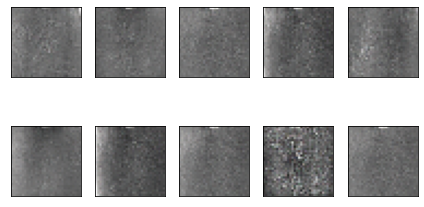

2/2 [==============================] - 0s 10ms/step
epoch = 337/600, d_loss=0.22633, g_loss=6.32705                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 338/600, d_loss=0.22452, g_loss=5.72061                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 339/600, d_loss=0.22061, g_loss=6.89800                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 340/600, d_loss=0.20287, g_loss=5.77940                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 341/600, d_loss=0.22907, g_loss=6.66190                                                                                                 

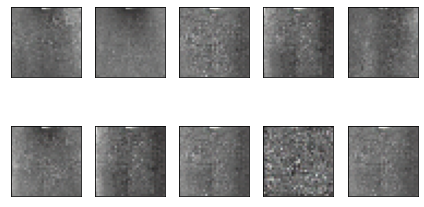

2/2 [==============================] - 0s 10ms/step
epoch = 342/600, d_loss=0.20866, g_loss=6.38170                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 343/600, d_loss=0.20375, g_loss=5.87608                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 344/600, d_loss=0.24452, g_loss=6.73700                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 345/600, d_loss=0.24657, g_loss=7.82560                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 346/600, d_loss=0.22540, g_loss=6.01944                                                                                                 

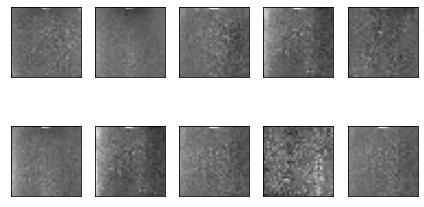

2/2 [==============================] - 0s 13ms/step
epoch = 347/600, d_loss=0.23114, g_loss=7.01593                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 348/600, d_loss=0.21857, g_loss=6.27610                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 349/600, d_loss=0.21673, g_loss=5.86152                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 350/600, d_loss=0.20379, g_loss=10.58232                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 351/600, d_loss=0.24558, g_loss=6.60755                                                                                                

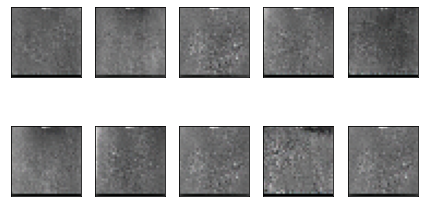

2/2 [==============================] - 0s 16ms/step
epoch = 352/600, d_loss=0.22688, g_loss=6.30811                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 353/600, d_loss=0.20321, g_loss=6.31840                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 354/600, d_loss=0.19094, g_loss=7.70078                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 355/600, d_loss=0.19698, g_loss=5.82843                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 356/600, d_loss=0.19924, g_loss=5.87515                                                                                                 

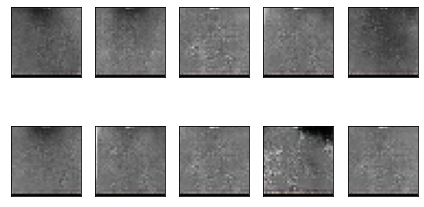

2/2 [==============================] - 0s 13ms/step
epoch = 357/600, d_loss=0.19975, g_loss=5.15962                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 358/600, d_loss=0.18844, g_loss=6.06115                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 359/600, d_loss=0.21463, g_loss=8.02611                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 360/600, d_loss=0.23225, g_loss=7.30255                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 361/600, d_loss=0.21112, g_loss=6.59918                                                                                                 

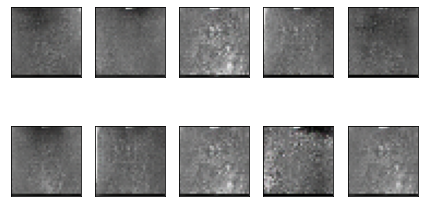

2/2 [==============================] - 0s 10ms/step
epoch = 362/600, d_loss=0.22030, g_loss=6.52494                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 363/600, d_loss=0.25041, g_loss=8.43780                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 364/600, d_loss=0.23071, g_loss=7.16026                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 365/600, d_loss=0.19548, g_loss=6.70300                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 366/600, d_loss=0.21173, g_loss=5.70650                                                                                                 

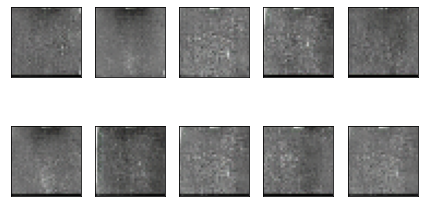

2/2 [==============================] - 0s 11ms/step
epoch = 367/600, d_loss=0.25794, g_loss=7.11424                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 368/600, d_loss=0.21827, g_loss=6.59416                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 369/600, d_loss=0.25003, g_loss=7.00133                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 370/600, d_loss=0.20665, g_loss=5.63843                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 371/600, d_loss=0.21389, g_loss=6.05866                                                                                                   

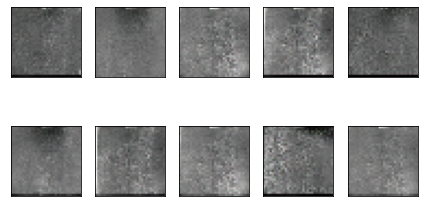

2/2 [==============================] - 0s 11ms/step
epoch = 372/600, d_loss=0.27922, g_loss=12.80249                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 373/600, d_loss=0.24255, g_loss=8.29582                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 374/600, d_loss=0.23433, g_loss=8.04694                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 375/600, d_loss=0.20409, g_loss=6.80323                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 376/600, d_loss=0.20221, g_loss=6.03517                                                                                                

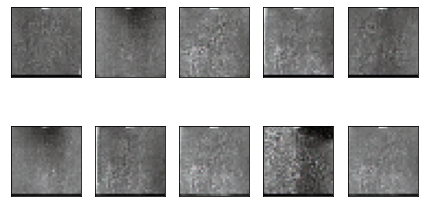

2/2 [==============================] - 0s 11ms/step
epoch = 377/600, d_loss=0.21575, g_loss=6.19778                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 378/600, d_loss=0.22439, g_loss=6.22990                                                                                                     
2/2 [==============================] - 0s 18ms/step
epoch = 379/600, d_loss=0.20251, g_loss=5.97946                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 380/600, d_loss=0.19421, g_loss=6.16093                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 381/600, d_loss=0.19934, g_loss=6.00002                                                                                                 

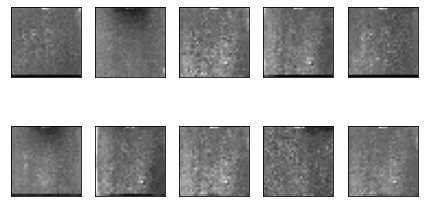

2/2 [==============================] - 0s 14ms/step
epoch = 382/600, d_loss=0.22315, g_loss=5.95832                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 383/600, d_loss=0.21452, g_loss=6.45106                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 384/600, d_loss=0.23734, g_loss=7.12648                                                                                                     
2/2 [==============================] - 0s 20ms/step
epoch = 385/600, d_loss=0.21313, g_loss=8.32047                                                                                                     
2/2 [==============================] - 0s 18ms/step
epoch = 386/600, d_loss=0.19795, g_loss=6.07409                                                                                                 

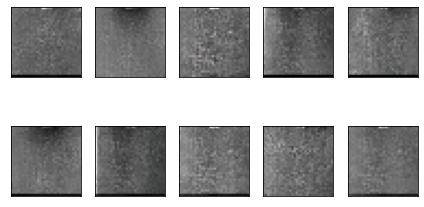

2/2 [==============================] - 0s 13ms/step
epoch = 387/600, d_loss=0.21074, g_loss=6.45104                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 388/600, d_loss=0.21554, g_loss=6.16657                                                                                                     
2/2 [==============================] - 0s 18ms/step
epoch = 389/600, d_loss=0.22115, g_loss=6.31669                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 390/600, d_loss=0.21313, g_loss=6.63812                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 391/600, d_loss=0.19368, g_loss=6.29000                                                                                                  

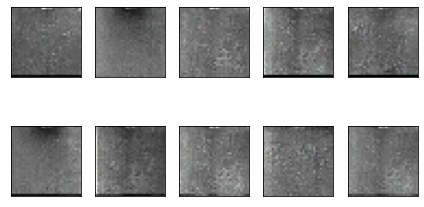

2/2 [==============================] - 0s 12ms/step
epoch = 392/600, d_loss=0.22944, g_loss=6.39981                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 393/600, d_loss=0.21926, g_loss=6.76244                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 394/600, d_loss=0.19969, g_loss=6.26725                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 395/600, d_loss=0.20949, g_loss=6.56964                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 396/600, d_loss=0.20735, g_loss=6.49012                                                                                                  

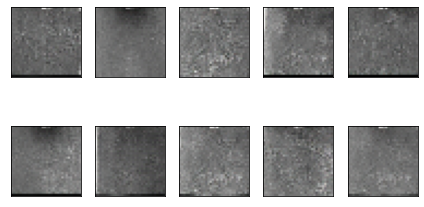

2/2 [==============================] - 0s 14ms/step
epoch = 397/600, d_loss=0.20599, g_loss=6.62893                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 398/600, d_loss=0.20285, g_loss=5.71157                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 399/600, d_loss=0.20790, g_loss=6.17336                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 400/600, d_loss=0.19313, g_loss=5.95688                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 401/600, d_loss=0.19709, g_loss=6.25781                                                                                                 

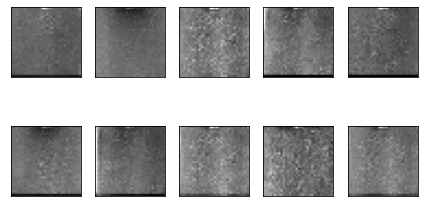

2/2 [==============================] - 0s 13ms/step
epoch = 402/600, d_loss=0.20726, g_loss=6.51228                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 403/600, d_loss=0.19240, g_loss=6.65664                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 404/600, d_loss=0.18824, g_loss=6.38517                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 405/600, d_loss=0.21919, g_loss=7.05551                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 406/600, d_loss=0.23791, g_loss=7.43801                                                                                                 

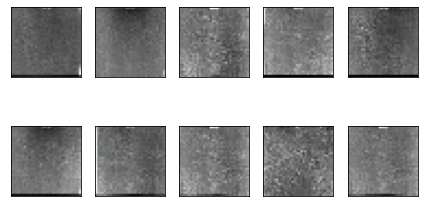

2/2 [==============================] - 0s 19ms/step
epoch = 407/600, d_loss=0.18735, g_loss=6.69970                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 408/600, d_loss=0.20660, g_loss=6.36106                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 409/600, d_loss=0.19638, g_loss=6.06085                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 410/600, d_loss=0.19830, g_loss=6.49211                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 411/600, d_loss=0.18705, g_loss=6.91666                                                                                                  

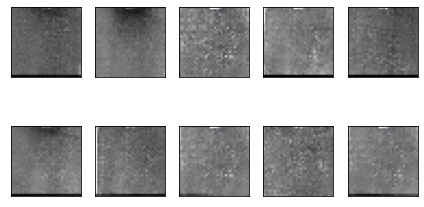

2/2 [==============================] - 0s 9ms/step
epoch = 412/600, d_loss=0.21834, g_loss=7.15346                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 413/600, d_loss=0.20642, g_loss=6.67743                                                                                                     
2/2 [==============================] - 0s 14ms/step
epoch = 414/600, d_loss=0.19016, g_loss=6.69429                                                                                                     
2/2 [==============================] - 0s 15ms/step
epoch = 415/600, d_loss=0.20118, g_loss=6.56244                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 416/600, d_loss=0.19000, g_loss=6.46293                                                                                                   

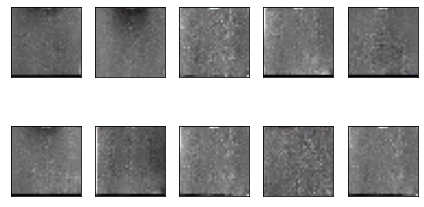

2/2 [==============================] - 0s 12ms/step
epoch = 417/600, d_loss=0.19445, g_loss=6.38239                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 418/600, d_loss=0.20217, g_loss=5.87584                                                                                                     
2/2 [==============================] - 0s 7ms/step
epoch = 419/600, d_loss=0.18344, g_loss=7.35349                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 420/600, d_loss=0.19468, g_loss=6.59865                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 421/600, d_loss=0.22125, g_loss=6.97929                                                                                                   

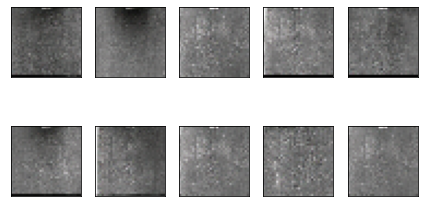

2/2 [==============================] - 0s 16ms/step
epoch = 422/600, d_loss=0.20084, g_loss=6.30977                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 423/600, d_loss=0.19131, g_loss=6.60068                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 424/600, d_loss=0.22213, g_loss=6.30741                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 425/600, d_loss=0.19040, g_loss=7.18352                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 426/600, d_loss=0.18896, g_loss=6.69672                                                                                                 

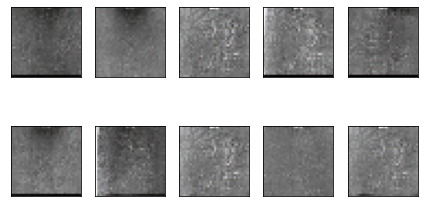

2/2 [==============================] - 0s 8ms/step
epoch = 427/600, d_loss=0.18844, g_loss=6.40968                                                                                                     
2/2 [==============================] - 0s 16ms/step
epoch = 428/600, d_loss=0.18958, g_loss=6.12549                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 429/600, d_loss=0.20828, g_loss=6.48884                                                                                                     
2/2 [==============================] - 0s 13ms/step
epoch = 430/600, d_loss=0.21071, g_loss=6.70963                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 431/600, d_loss=0.21735, g_loss=7.36369                                                                                                   

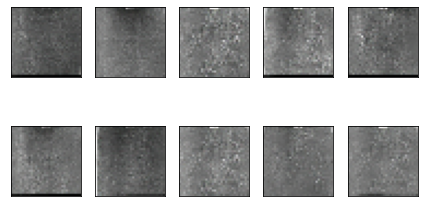

2/2 [==============================] - 0s 12ms/step
epoch = 432/600, d_loss=0.18933, g_loss=6.94322                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 433/600, d_loss=0.18938, g_loss=7.70660                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 434/600, d_loss=0.19378, g_loss=6.53564                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 435/600, d_loss=0.22369, g_loss=6.96162                                                                                                     
2/2 [==============================] - 0s 19ms/step
epoch = 436/600, d_loss=0.26608, g_loss=5.39143                                                                                                 

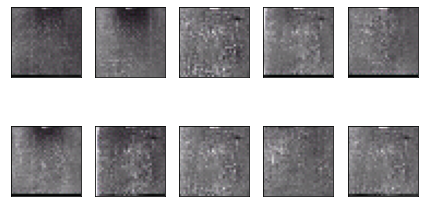

2/2 [==============================] - 0s 9ms/step
epoch = 437/600, d_loss=0.24275, g_loss=7.25388                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 438/600, d_loss=0.26337, g_loss=7.51459                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 439/600, d_loss=0.25226, g_loss=8.80352                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 440/600, d_loss=0.19392, g_loss=6.61372                                                                                                     
2/2 [==============================] - 0s 12ms/step
epoch = 441/600, d_loss=0.23271, g_loss=6.96534                                                                                                  

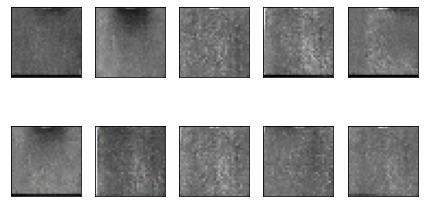

2/2 [==============================] - 0s 9ms/step
epoch = 442/600, d_loss=0.21316, g_loss=5.50802                                                                                                     
2/2 [==============================] - 0s 10ms/step
epoch = 443/600, d_loss=0.22064, g_loss=6.32867                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 444/600, d_loss=0.21347, g_loss=5.78794                                                                                                     
2/2 [==============================] - 0s 11ms/step
epoch = 445/600, d_loss=0.19715, g_loss=6.00147                                                                                                     
2/2 [==============================] - 0s 17ms/step
epoch = 446/600, d_loss=0.20681, g_loss=5.85070                                                                                                   

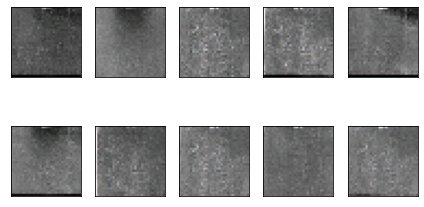

2/2 [==============================] - 0s 14ms/step
epoch = 447/600, d_loss=0.19646, g_loss=6.21000                                                                                                     
2/2 [==============================] - 0s 9ms/step
epoch = 448/600, d_loss=0.19644, g_loss=5.80324                                                                                                     
2/2 [==============================] - 0s 16ms/step


KeyboardInterrupt: ignored

In [ ]:
encoder.trainable = False  # Freeze the encoder model
epochs = 600
batch_size = 64
smooth = 0.1
X_train = discriminator_data
real = np.ones(shape=(batch_size, 1))
fake = np.zeros(shape=(batch_size, 1))
d_loss = []
g_loss = []

for e in range(epochs + 1):
    for i in range(len(X_train) // batch_size):

        # Train Discriminator weights
        discriminator.trainable = True

        # Real samples
        X_batch = X_train[i*batch_size:(i+1)*batch_size]
        d_loss_real = discriminator.train_on_batch(x=X_batch,
                                                   y=real * (1 - smooth))

        # Fake Samples
        #z = np.random.normal(loc=0, scale=1, size=(batch_size, latent_dim))
        tmp_z = encoder.predict(encoder_data[i*batch_size:(i+1)*batch_size])
        z = np.array(tmp_z)[2]
        #print(type(preds))
        #print(np.array(preds)[2].shape)
        X_fake = generator.predict_on_batch(z)
        d_loss_fake = discriminator.train_on_batch(x=X_fake, y=fake)

        # Discriminator loss
        d_loss_batch = 0.5 * (d_loss_real[0] + d_loss_fake[0])

        # Train Generator weights
        discriminator.trainable = False
        g_loss_batch = d_g.train_on_batch(x=z, y=real)

        print(
            'epoch = %d/%d, batch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, i, len(X_train) // batch_size, d_loss_batch, g_loss_batch[0]),
            100*' ',
            end='\r'
        )

    d_loss.append(d_loss_batch)
    g_loss.append(g_loss_batch[0])
    print('epoch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, d_loss[-1], g_loss[-1]), 100*' ')

    if e % 5 == 0:
        samples = 10
        #x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))
        tmp_z = encoder.predict(encoder_data[:samples])
        z = np.array(tmp_z)[2]
        x_fake = generator.predict(z)

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))
            #plt.imshow(x_fake[k].astype('uint8'), cmap='gray')

        plt.tight_layout()
        plt.show()

Increasing dropout rate of discriminator to 0.5

In [ ]:
# latent space dimension
latent_dim = 128

init = initializers.RandomNormal(stddev=0.02)

# Generator network
generator = Sequential()

generator.add(Dense(2*2*256, input_shape=(latent_dim,), kernel_initializer=init))
generator.add(Reshape((2, 2, 256)))
generator.add(ReLU())

generator.add(Conv2DTranspose(512, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(256, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(128, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(3, (5, 5), strides=2,padding='same', activation='tanh'))
generator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 1024)              132096    
                                                                 
 reshape_2 (Reshape)         (None, 2, 2, 256)         0         
                                                                 
 re_lu_8 (ReLU)              (None, 2, 2, 256)         0         
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 4, 4, 512)        3277312   
 ranspose)                                                       
                                                                 
 re_lu_9 (ReLU)              (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 8, 8, 256)        3277056   
 ranspose)                                            

In [ ]:
# imagem shape 32x32x3
img_shape = discriminator_data[0].shape

# Discriminator network
discriminator = Sequential()

discriminator.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same',
                         input_shape=(img_shape), kernel_initializer=init))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

# FC
discriminator.add(Flatten())
discriminator.add(Dropout(0.5))
# Output
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 16, 16, 128)       9728      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 8, 8, 256)         819456    
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 8, 8, 256)         0         
                                                                 
 conv2d_10 (Conv2D)          (None, 4, 4, 512)         3277312   
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 4, 4, 512)         0         
                                                                 
 conv2d_11 (Conv2D)          (None, 2, 2, 1024)       

In [ ]:
discriminator.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
                      metrics=['accuracy'])

discriminator.trainable = False

z = Input(shape=(latent_dim,))
img = generator(z)
decision = discriminator(img)
d_g = Model(inputs=z, outputs=decision)

d_g.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
            metrics=['accuracy'])

In [ ]:
d_g.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 sequential_3 (Sequential)   (None, 32, 32, 3)         7515395   
                                                                 
 sequential_5 (Sequential)   (None, 1)                 17218817  
                                                                 
Total params: 24,734,212
Trainable params: 7,515,395
Non-trainable params: 17,218,817
_________________________________________________________________


epoch = 1/100, d_loss=0.36254, g_loss=2.99823                                                                                                     
1/1 [==============================] - 0s 107ms/step


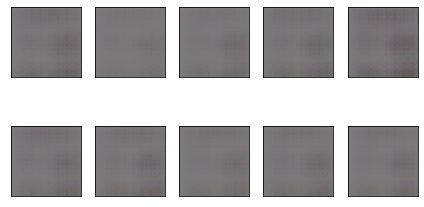

epoch = 2/100, d_loss=0.28958, g_loss=5.56529                                                                                                     
epoch = 3/100, d_loss=0.26977, g_loss=5.06976                                                                                                     
epoch = 4/100, d_loss=0.37311, g_loss=3.16760                                                                                                     
epoch = 5/100, d_loss=0.85247, g_loss=5.51526                                                                                                     
epoch = 6/100, d_loss=0.52563, g_loss=3.34282                                                                                                     
1/1 [==============================] - 0s 36ms/step


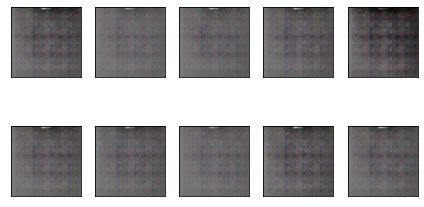

epoch = 7/100, d_loss=0.46628, g_loss=3.91860                                                                                                     
epoch = 8/100, d_loss=0.41890, g_loss=3.39888                                                                                                     
epoch = 9/100, d_loss=0.47300, g_loss=3.41019                                                                                                     
epoch = 10/100, d_loss=0.43261, g_loss=3.50194                                                                                                     
epoch = 11/100, d_loss=0.41083, g_loss=4.01019                                                                                                     
1/1 [==============================] - 0s 18ms/step


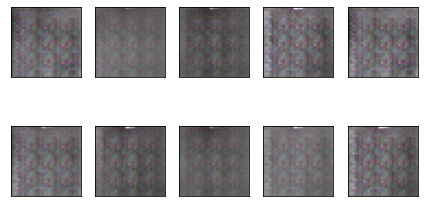

epoch = 12/100, d_loss=0.29441, g_loss=3.30917                                                                                                     
epoch = 13/100, d_loss=0.32275, g_loss=4.91574                                                                                                     
epoch = 14/100, d_loss=1.38298, g_loss=3.11440                                                                                                     
epoch = 15/100, d_loss=0.33480, g_loss=3.36490                                                                                                     
epoch = 16/100, d_loss=0.42591, g_loss=5.28305                                                                                                     
1/1 [==============================] - 0s 20ms/step


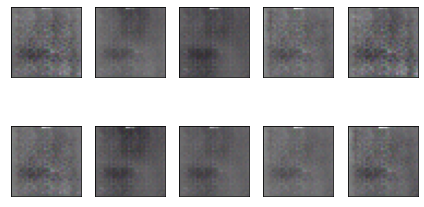

epoch = 17/100, d_loss=0.51738, g_loss=5.43389                                                                                                     
epoch = 18/100, d_loss=0.38098, g_loss=3.52505                                                                                                     
epoch = 19/100, d_loss=0.74005, g_loss=8.26374                                                                                                     
epoch = 20/100, d_loss=0.23099, g_loss=5.19845                                                                                                     
epoch = 21/100, d_loss=0.29775, g_loss=3.13633                                                                                                     
1/1 [==============================] - 0s 18ms/step


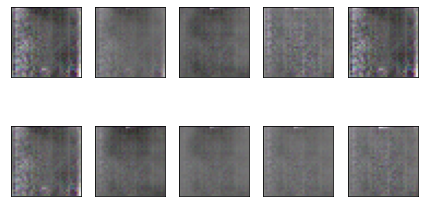

epoch = 22/100, d_loss=0.50306, g_loss=5.71805                                                                                                     
epoch = 23/100, d_loss=0.35016, g_loss=3.30351                                                                                                     
epoch = 24/100, d_loss=0.86680, g_loss=3.70179                                                                                                     
epoch = 25/100, d_loss=0.81717, g_loss=9.11250                                                                                                     
epoch = 26/100, d_loss=0.89539, g_loss=10.30108                                                                                                     
1/1 [==============================] - 0s 37ms/step


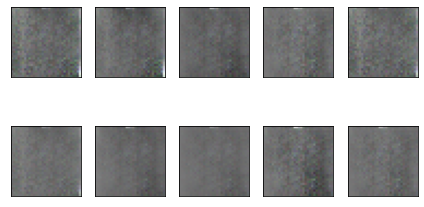

epoch = 27/100, d_loss=0.96975, g_loss=4.06563                                                                                                     
epoch = 28/100, d_loss=0.25219, g_loss=3.80152                                                                                                     
epoch = 29/100, d_loss=0.34553, g_loss=3.75788                                                                                                     
epoch = 30/100, d_loss=0.32391, g_loss=2.91598                                                                                                     
epoch = 31/100, d_loss=0.57874, g_loss=6.94749                                                                                                     
1/1 [==============================] - 0s 18ms/step


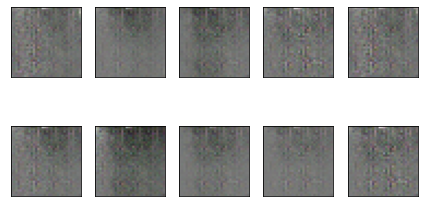

epoch = 32/100, d_loss=0.49320, g_loss=4.57453                                                                                                     
epoch = 33/100, d_loss=0.37054, g_loss=3.39743                                                                                                     
epoch = 34/100, d_loss=0.31737, g_loss=3.81476                                                                                                     
epoch = 35/100, d_loss=0.30895, g_loss=3.04513                                                                                                     
epoch = 36/100, d_loss=0.25758, g_loss=4.26029                                                                                                     
1/1 [==============================] - 0s 19ms/step


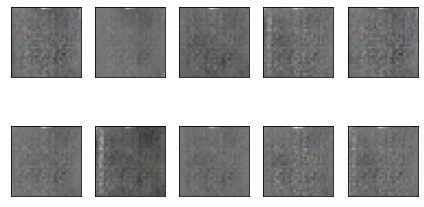

epoch = 37/100, d_loss=0.40649, g_loss=6.23540                                                                                                     
epoch = 38/100, d_loss=0.26263, g_loss=3.37471                                                                                                     
epoch = 39/100, d_loss=0.38435, g_loss=5.27007                                                                                                     
epoch = 40/100, d_loss=0.46823, g_loss=4.72987                                                                                                     
epoch = 41/100, d_loss=0.56795, g_loss=3.43707                                                                                                     
1/1 [==============================] - 0s 24ms/step


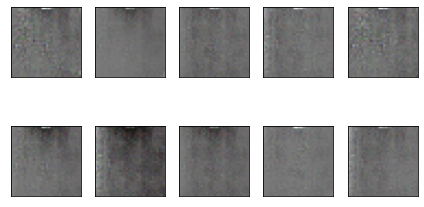

epoch = 42/100, d_loss=0.37221, g_loss=4.47694                                                                                                     
epoch = 43/100, d_loss=0.33987, g_loss=4.71556                                                                                                     
epoch = 44/100, d_loss=0.23464, g_loss=4.07524                                                                                                     
epoch = 45/100, d_loss=0.38581, g_loss=5.17990                                                                                                     
epoch = 46/100, d_loss=0.32480, g_loss=5.50435                                                                                                     
1/1 [==============================] - 0s 33ms/step


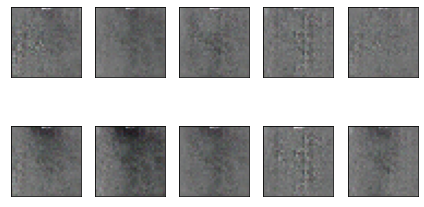

epoch = 47/100, d_loss=0.48417, g_loss=5.57000                                                                                                     
epoch = 48/100, d_loss=0.28838, g_loss=3.57153                                                                                                     
epoch = 49/100, d_loss=0.40974, g_loss=3.18424                                                                                                     
epoch = 50/100, d_loss=0.26783, g_loss=4.83584                                                                                                     
epoch = 51/100, d_loss=0.45028, g_loss=7.59294                                                                                                     
1/1 [==============================] - 0s 27ms/step


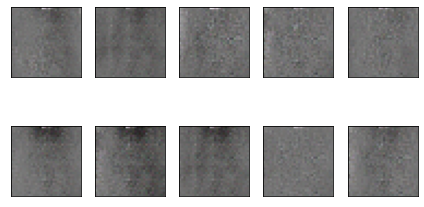

epoch = 52/100, d_loss=0.45801, g_loss=3.57725                                                                                                     
epoch = 53/100, d_loss=0.23952, g_loss=4.94619                                                                                                     
epoch = 54/100, d_loss=0.43901, g_loss=7.09349                                                                                                     
epoch = 55/100, d_loss=0.40109, g_loss=5.44535                                                                                                     
epoch = 56/100, d_loss=0.30481, g_loss=4.29134                                                                                                     
1/1 [==============================] - 0s 19ms/step


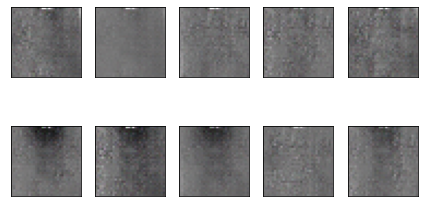

epoch = 57/100, d_loss=0.27359, g_loss=4.62009                                                                                                     
epoch = 58/100, d_loss=0.28429, g_loss=4.16782                                                                                                     
epoch = 59/100, d_loss=0.37760, g_loss=3.33555                                                                                                     
epoch = 60/100, d_loss=0.43481, g_loss=7.67598                                                                                                     
epoch = 61/100, d_loss=0.55260, g_loss=4.67101                                                                                                     
1/1 [==============================] - 0s 21ms/step


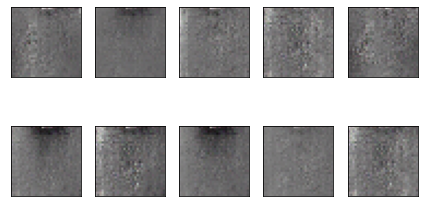

epoch = 62/100, d_loss=0.54636, g_loss=4.06362                                                                                                     
epoch = 63/100, d_loss=0.40819, g_loss=5.15411                                                                                                     
epoch = 64/100, d_loss=0.31157, g_loss=4.26272                                                                                                     
epoch = 65/100, d_loss=0.34940, g_loss=6.56910                                                                                                     
epoch = 66/100, d_loss=0.40237, g_loss=5.08096                                                                                                     
1/1 [==============================] - 0s 23ms/step


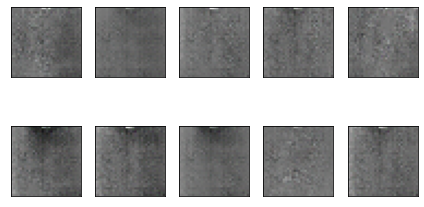

epoch = 67/100, d_loss=0.43058, g_loss=3.39478                                                                                                     
epoch = 68/100, d_loss=0.43035, g_loss=5.36019                                                                                                     
epoch = 69/100, d_loss=0.40719, g_loss=4.99600                                                                                                     
epoch = 70/100, d_loss=0.38497, g_loss=4.63008                                                                                                     
epoch = 71/100, d_loss=0.34130, g_loss=5.80954                                                                                                     
1/1 [==============================] - 0s 20ms/step


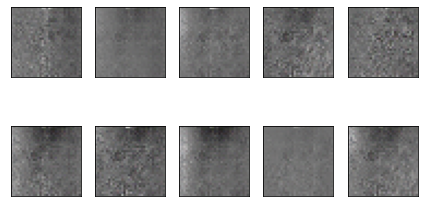

epoch = 72/100, d_loss=0.33358, g_loss=6.65196                                                                                                     
epoch = 73/100, d_loss=0.48987, g_loss=6.77745                                                                                                     
epoch = 74/100, d_loss=0.35107, g_loss=5.23452                                                                                                     
epoch = 75/100, d_loss=0.38357, g_loss=6.13322                                                                                                     
epoch = 76/100, d_loss=0.38895, g_loss=4.30891                                                                                                     
1/1 [==============================] - 0s 19ms/step


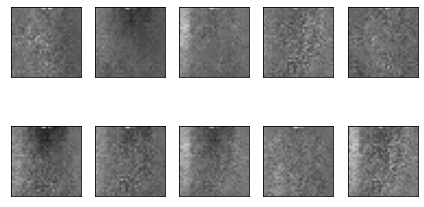

epoch = 77/100, d_loss=0.31894, g_loss=4.27793                                                                                                     
epoch = 78/100, d_loss=0.40839, g_loss=4.50908                                                                                                     
epoch = 79/100, d_loss=0.34610, g_loss=4.36249                                                                                                     
epoch = 80/100, d_loss=0.35636, g_loss=4.26541                                                                                                     
epoch = 81/100, d_loss=0.42020, g_loss=6.77991                                                                                                     
1/1 [==============================] - 0s 30ms/step


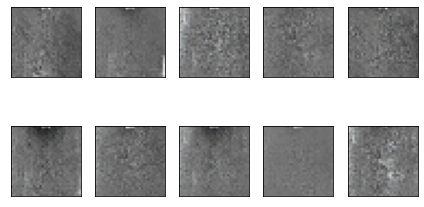

epoch = 82/100, d_loss=0.44048, g_loss=4.35345                                                                                                     
epoch = 83/100, d_loss=0.31370, g_loss=4.44347                                                                                                     
epoch = 84/100, d_loss=0.43752, g_loss=3.73771                                                                                                     
epoch = 85/100, d_loss=0.26238, g_loss=5.48463                                                                                                     
epoch = 86/100, d_loss=0.34093, g_loss=3.80483                                                                                                     
1/1 [==============================] - 0s 19ms/step


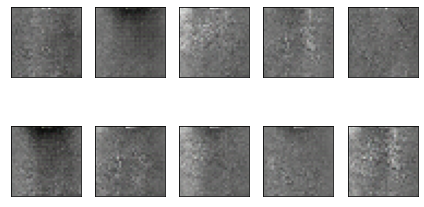

epoch = 87/100, d_loss=0.37506, g_loss=5.22618                                                                                                     
epoch = 88/100, d_loss=0.60099, g_loss=4.57424                                                                                                     
epoch = 89/100, d_loss=0.29933, g_loss=3.94195                                                                                                     
epoch = 90/100, d_loss=0.24915, g_loss=4.46494                                                                                                     
epoch = 91/100, d_loss=0.34025, g_loss=6.47521                                                                                                     
1/1 [==============================] - 0s 20ms/step


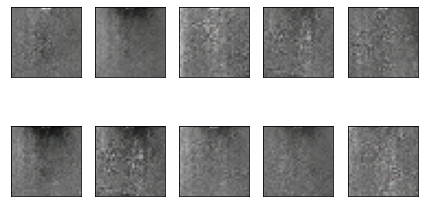

epoch = 92/100, d_loss=0.37057, g_loss=4.57641                                                                                                     
epoch = 93/100, d_loss=0.37727, g_loss=4.90888                                                                                                     
epoch = 94/100, d_loss=0.24533, g_loss=4.64515                                                                                                     
epoch = 95/100, d_loss=0.38650, g_loss=4.10283                                                                                                     
epoch = 96/100, d_loss=0.34216, g_loss=4.90187                                                                                                     
1/1 [==============================] - 0s 22ms/step


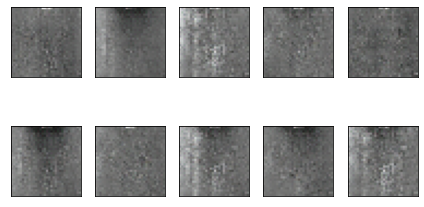

epoch = 97/100, d_loss=0.33052, g_loss=4.44310                                                                                                     
epoch = 98/100, d_loss=0.39941, g_loss=4.57935                                                                                                     
epoch = 99/100, d_loss=0.31440, g_loss=4.90801                                                                                                     
epoch = 100/100, d_loss=0.42030, g_loss=4.91232                                                                                                     
epoch = 101/100, d_loss=0.25737, g_loss=4.89085                                                                                                     
1/1 [==============================] - 0s 21ms/step


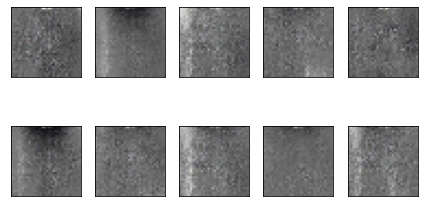

In [ ]:
encoder.trainable = True  # unFreeze the encoder model
epochs = 100
batch_size = 32
smooth = 0.1
X_train = discriminator_data
real = np.ones(shape=(batch_size, 1))
fake = np.zeros(shape=(batch_size, 1))
d_loss = []
g_loss = []

for e in range(epochs + 1):
    for i in range(len(X_train) // batch_size):

        # Train Discriminator weights
        discriminator.trainable = True

        # Real samples
        X_batch = X_train[i*batch_size:(i+1)*batch_size]
        d_loss_real = discriminator.train_on_batch(x=X_batch,
                                                   y=real * (1 - smooth))

        # Fake Samples
        #z = np.random.normal(loc=0, scale=1, size=(batch_size, latent_dim))
        #tmp_z = encoder.predict(encoder_data[i*batch_size:(i+1)*batch_size])
        tmp_z = encoder(encoder_data[i*batch_size:(i+1)*batch_size])
        z = np.array(tmp_z)[2]
        #print(type(preds))
        #print(np.array(preds)[2].shape)
        X_fake = generator.predict_on_batch(z)
        d_loss_fake = discriminator.train_on_batch(x=X_fake, y=fake)

        # Discriminator loss
        d_loss_batch = 0.5 * (d_loss_real[0] + d_loss_fake[0])

        # Train Generator weights
        discriminator.trainable = False
        g_loss_batch = d_g.train_on_batch(x=z, y=real)

        print(
            'epoch = %d/%d, batch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, i, len(X_train) // batch_size, d_loss_batch, g_loss_batch[0]),
            100*' ',
            end='\r'
        )

    d_loss.append(d_loss_batch)
    g_loss.append(g_loss_batch[0])
    print('epoch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, d_loss[-1], g_loss[-1]), 100*' ')

    if e % 5 == 0:
        samples = 10
        #x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))
        tmp_z = encoder.predict(encoder_data[:samples])
        z = np.array(tmp_z)[2]
        x_fake = generator.predict(z)

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))
            #plt.imshow(x_fake[k].astype('uint8'), cmap='gray')

        plt.tight_layout()
        plt.show()

In [ ]:
generator.save('/content/drive/MyDrive/gen2.h5')
encoder.save('/content/drive/MyDrive/enc2.h5')

Increasing neurons in dense layer of generator

In [ ]:
# latent space dimension
latent_dim = 128

init = initializers.RandomNormal(stddev=0.02)

# Generator network
generator = Sequential()

generator.add(Dense(2*2*512, input_shape=(latent_dim,), kernel_initializer=init))
generator.add(Reshape((2, 2, 512)))
generator.add(ReLU())

generator.add(Conv2DTranspose(512, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(256, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(128, (5, 5), strides=2, padding='same'))
generator.add(ReLU())

generator.add(Conv2DTranspose(3, (5, 5), strides=2,padding='same', activation='tanh'))
generator.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 2048)              264192    
                                                                 
 reshape_8 (Reshape)         (None, 2, 2, 512)         0         
                                                                 
 re_lu_28 (ReLU)             (None, 2, 2, 512)         0         
                                                                 
 conv2d_transpose_28 (Conv2D  (None, 4, 4, 512)        6554112   
 Transpose)                                                      
                                                                 
 re_lu_29 (ReLU)             (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_29 (Conv2D  (None, 8, 8, 256)        3277056   
 Transpose)                                          

In [ ]:
# imagem shape 32x32x3
img_shape = discriminator_data[0].shape

# Discriminator network
discriminator = Sequential()

discriminator.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same',
                         input_shape=(img_shape), kernel_initializer=init))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

discriminator.add(Conv2D(1024, (5, 5), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(0.2))

# FC
discriminator.add(Flatten())
discriminator.add(Dropout(0.4))
# Output
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 16, 16, 128)       9728      
                                                                 
 leaky_re_lu_28 (LeakyReLU)  (None, 16, 16, 128)       0         
                                                                 
 conv2d_29 (Conv2D)          (None, 8, 8, 256)         819456    
                                                                 
 leaky_re_lu_29 (LeakyReLU)  (None, 8, 8, 256)         0         
                                                                 
 conv2d_30 (Conv2D)          (None, 4, 4, 512)         3277312   
                                                                 
 leaky_re_lu_30 (LeakyReLU)  (None, 4, 4, 512)         0         
                                                                 
 conv2d_31 (Conv2D)          (None, 2, 2, 1024)      

/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [ ]:
discriminator.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
                      metrics=['accuracy'])

discriminator.trainable = False

z = Input(shape=(latent_dim,))
img = generator(z)
decision = discriminator(img)
d_g = Model(inputs=z, outputs=decision)

d_g.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.0002, beta_1=0.5), loss='binary_crossentropy',
            metrics=['accuracy'])

d_g.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 128)]             0         
                                                                 
 sequential_15 (Sequential)  (None, 32, 32, 3)         10924291  
                                                                 
 sequential_16 (Sequential)  (None, 1)                 17218817  
                                                                 
Total params: 28,143,108
Trainable params: 10,924,291
Non-trainable params: 17,218,817
_________________________________________________________________


epoch = 1/100, d_loss=0.25236, g_loss=3.07554                                                                                                     
1/1 [==============================] - 0s 151ms/step


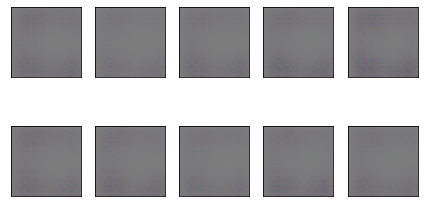

epoch = 2/100, d_loss=0.63489, g_loss=6.78295                                                                                                     
epoch = 3/100, d_loss=0.24073, g_loss=4.28306                                                                                                     
epoch = 4/100, d_loss=0.26631, g_loss=4.67010                                                                                                     
epoch = 5/100, d_loss=0.28505, g_loss=3.23614                                                                                                     
epoch = 6/100, d_loss=0.32376, g_loss=3.34708                                                                                                     
1/1 [==============================] - 0s 18ms/step


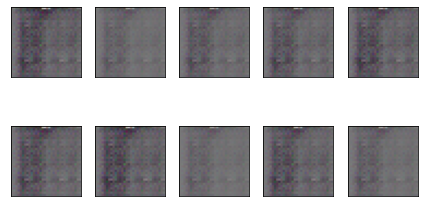

epoch = 7/100, d_loss=0.29629, g_loss=3.37560                                                                                                     
epoch = 8/100, d_loss=0.30134, g_loss=4.32483                                                                                                     
epoch = 9/100, d_loss=0.25683, g_loss=4.39603                                                                                                     
epoch = 10/100, d_loss=0.27668, g_loss=3.56018                                                                                                     
epoch = 11/100, d_loss=0.24247, g_loss=3.88509                                                                                                     
1/1 [==============================] - 0s 18ms/step


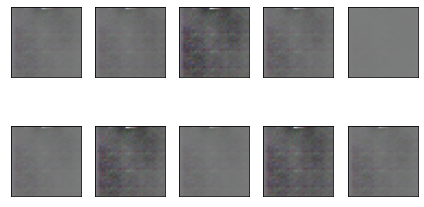

epoch = 12/100, d_loss=0.26062, g_loss=4.18341                                                                                                     
epoch = 13/100, d_loss=0.37603, g_loss=3.34620                                                                                                     
epoch = 14/100, d_loss=0.41116, g_loss=2.25893                                                                                                     
epoch = 15/100, d_loss=0.36272, g_loss=3.62151                                                                                                     
epoch = 16/100, d_loss=0.34867, g_loss=3.84045                                                                                                     
1/1 [==============================] - 0s 20ms/step


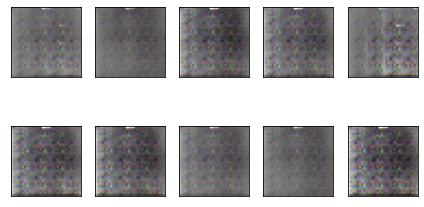

epoch = 17/100, d_loss=0.27628, g_loss=3.52207                                                                                                     
epoch = 18/100, d_loss=0.26496, g_loss=4.85467                                                                                                     
epoch = 19/100, d_loss=0.29738, g_loss=5.65158                                                                                                     
epoch = 20/100, d_loss=0.31320, g_loss=3.48311                                                                                                     
epoch = 21/100, d_loss=0.30576, g_loss=3.89872                                                                                                     
1/1 [==============================] - 0s 18ms/step


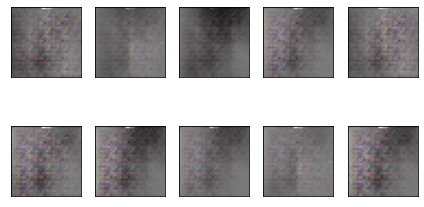

epoch = 22/100, d_loss=0.36481, g_loss=4.26447                                                                                                     
epoch = 23/100, d_loss=0.33708, g_loss=2.97645                                                                                                     
epoch = 24/100, d_loss=0.51492, g_loss=9.74981                                                                                                     
epoch = 25/100, d_loss=0.24752, g_loss=3.91371                                                                                                     
epoch = 26/100, d_loss=0.28374, g_loss=3.60641                                                                                                     
1/1 [==============================] - 0s 19ms/step


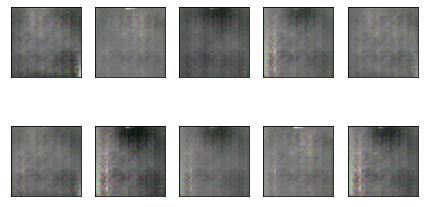

epoch = 27/100, d_loss=0.41169, g_loss=3.88216                                                                                                     
epoch = 28/100, d_loss=0.27170, g_loss=4.79627                                                                                                     
epoch = 29/100, d_loss=0.36867, g_loss=9.45926                                                                                                     
epoch = 30/100, d_loss=0.35851, g_loss=5.50138                                                                                                     
epoch = 31/100, d_loss=0.30847, g_loss=3.05193                                                                                                     
1/1 [==============================] - 0s 29ms/step


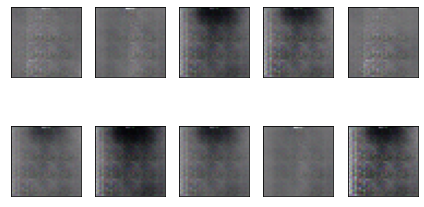

epoch = 32/100, d_loss=0.28535, g_loss=5.17560                                                                                                     
epoch = 33/100, d_loss=0.39939, g_loss=4.89390                                                                                                     
epoch = 34/100, d_loss=0.32918, g_loss=3.01375                                                                                                     
epoch = 35/100, d_loss=0.31472, g_loss=4.80087                                                                                                     
epoch = 36/100, d_loss=0.29066, g_loss=3.46379                                                                                                     
1/1 [==============================] - 0s 19ms/step


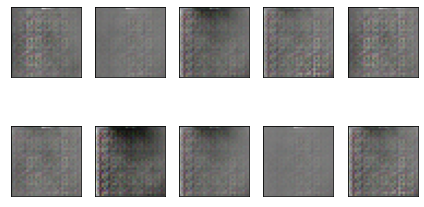

epoch = 37/100, d_loss=0.29295, g_loss=4.68665                                                                                                     
epoch = 38/100, d_loss=0.37678, g_loss=7.37990                                                                                                     
epoch = 39/100, d_loss=0.25667, g_loss=3.69300                                                                                                     
epoch = 40/100, d_loss=0.24458, g_loss=4.21274                                                                                                     
epoch = 41/100, d_loss=0.43577, g_loss=6.08087                                                                                                     
1/1 [==============================] - 0s 18ms/step


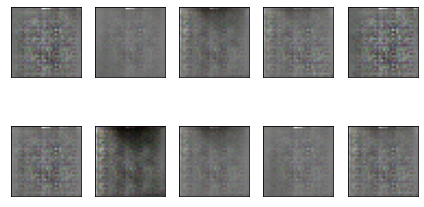

epoch = 42/100, d_loss=0.30701, g_loss=4.80814                                                                                                     
epoch = 43/100, d_loss=0.25682, g_loss=6.47466                                                                                                     
epoch = 44/100, d_loss=0.23604, g_loss=3.91377                                                                                                     
epoch = 45/100, d_loss=0.42474, g_loss=5.91388                                                                                                     
epoch = 46/100, d_loss=0.39751, g_loss=3.98696                                                                                                     
1/1 [==============================] - 0s 23ms/step


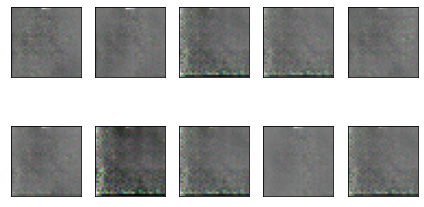

epoch = 47/100, d_loss=0.32827, g_loss=3.26839                                                                                                     
epoch = 48/100, d_loss=0.22454, g_loss=4.43258                                                                                                     
epoch = 49/100, d_loss=0.30619, g_loss=5.70452                                                                                                     
epoch = 50/100, d_loss=0.75367, g_loss=8.61823                                                                                                     
epoch = 51/100, d_loss=0.33547, g_loss=6.07022                                                                                                     
1/1 [==============================] - 0s 29ms/step


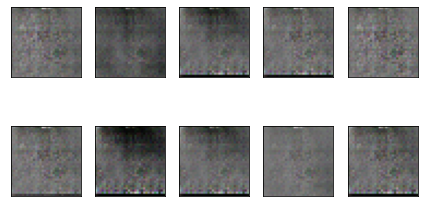

epoch = 52/100, d_loss=0.27873, g_loss=4.13818                                                                                                     
epoch = 53/100, d_loss=0.24245, g_loss=3.67855                                                                                                     
epoch = 54/100, d_loss=0.38378, g_loss=5.62246                                                                                                     
epoch = 55/100, d_loss=0.31717, g_loss=4.11916                                                                                                     
epoch = 56/100, d_loss=0.25447, g_loss=4.96263                                                                                                     
1/1 [==============================] - 0s 22ms/step


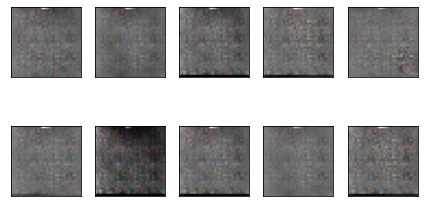

epoch = 57/100, d_loss=0.24784, g_loss=5.81332                                                                                                     
epoch = 58/100, d_loss=0.27265, g_loss=4.13635                                                                                                     
epoch = 59/100, d_loss=0.31300, g_loss=4.38151                                                                                                     
epoch = 60/100, d_loss=0.34211, g_loss=6.23767                                                                                                     
epoch = 61/100, d_loss=0.30903, g_loss=4.57060                                                                                                     
1/1 [==============================] - 0s 19ms/step


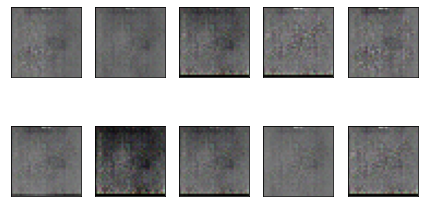

epoch = 62/100, d_loss=0.66948, g_loss=8.25974                                                                                                     
epoch = 63/100, d_loss=0.33097, g_loss=4.23628                                                                                                     
epoch = 64/100, d_loss=0.38373, g_loss=6.15171                                                                                                     
epoch = 65/100, d_loss=0.20665, g_loss=4.39472                                                                                                     
epoch = 66/100, d_loss=0.22442, g_loss=4.78976                                                                                                     
1/1 [==============================] - 0s 23ms/step


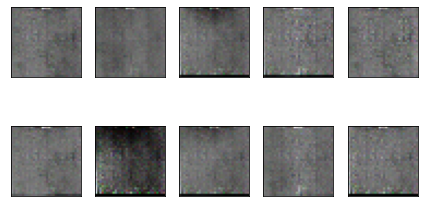

epoch = 67/100, d_loss=0.40631, g_loss=5.10030                                                                                                     
epoch = 68/100, d_loss=0.33830, g_loss=5.03791                                                                                                     
epoch = 69/100, d_loss=0.26266, g_loss=4.66425                                                                                                     
epoch = 70/100, d_loss=0.25600, g_loss=4.70584                                                                                                     
epoch = 71/100, d_loss=0.29501, g_loss=4.69530                                                                                                     
1/1 [==============================] - 0s 36ms/step


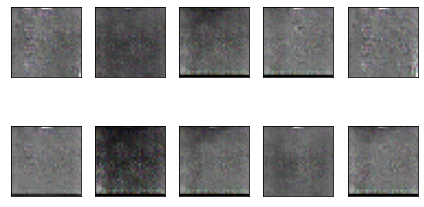

epoch = 72/100, d_loss=0.37482, g_loss=5.24541                                                                                                     
epoch = 73/100, d_loss=0.27514, g_loss=7.04832                                                                                                     
epoch = 74/100, d_loss=0.44012, g_loss=6.95526                                                                                                     
epoch = 75/100, d_loss=0.31803, g_loss=4.66531                                                                                                     
epoch = 76/100, d_loss=0.23517, g_loss=5.06302                                                                                                     
1/1 [==============================] - 0s 38ms/step


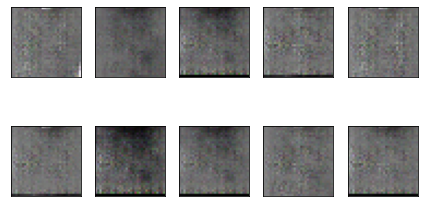

epoch = 77/100, d_loss=0.34242, g_loss=5.19509                                                                                                     
epoch = 78/100, d_loss=0.81060, g_loss=8.41230                                                                                                     
epoch = 79/100, d_loss=0.44621, g_loss=5.23778                                                                                                     
epoch = 80/100, d_loss=0.29738, g_loss=4.82100                                                                                                     
epoch = 81/100, d_loss=0.31336, g_loss=4.47049                                                                                                     
1/1 [==============================] - 0s 18ms/step


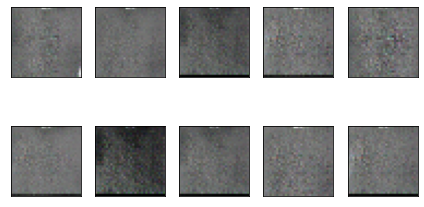

epoch = 82/100, d_loss=0.34506, g_loss=5.76106                                                                                                     
epoch = 83/100, d_loss=0.27691, g_loss=5.28030                                                                                                     
epoch = 84/100, d_loss=0.27612, g_loss=5.32084                                                                                                     
epoch = 85/100, d_loss=0.22594, g_loss=5.20489                                                                                                     
epoch = 86/100, d_loss=0.31121, g_loss=6.60003                                                                                                     
1/1 [==============================] - 0s 19ms/step


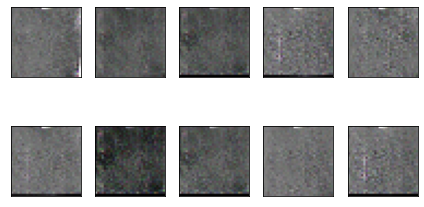

epoch = 87/100, d_loss=0.33427, g_loss=4.41174                                                                                                     
epoch = 88/100, d_loss=0.27597, g_loss=4.82539                                                                                                     
epoch = 89/100, d_loss=0.32929, g_loss=3.97013                                                                                                     
epoch = 90/100, d_loss=0.41526, g_loss=8.73323                                                                                                     
epoch = 91/100, d_loss=0.29628, g_loss=4.74557                                                                                                     
1/1 [==============================] - 0s 23ms/step


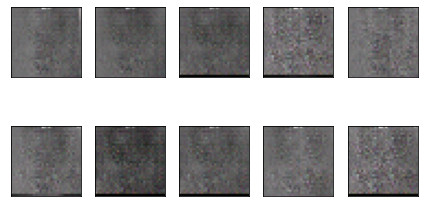

epoch = 92/100, d_loss=0.25168, g_loss=5.58711                                                                                                     
epoch = 93/100, d_loss=0.28681, g_loss=5.29143                                                                                                     
epoch = 94/100, d_loss=0.35987, g_loss=6.22398                                                                                                     
epoch = 95/100, d_loss=0.35753, g_loss=6.24149                                                                                                     
epoch = 96/100, d_loss=0.22990, g_loss=5.05728                                                                                                     
1/1 [==============================] - 0s 19ms/step


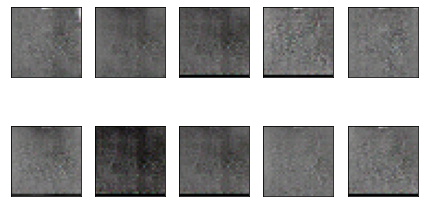

epoch = 97/100, d_loss=0.38123, g_loss=6.88004                                                                                                     
epoch = 98/100, d_loss=0.29852, g_loss=5.03275                                                                                                     
epoch = 99/100, d_loss=0.33621, g_loss=4.46471                                                                                                     
epoch = 100/100, d_loss=0.24509, g_loss=5.07122                                                                                                     
epoch = 101/100, d_loss=0.31474, g_loss=4.50173                                                                                                     
1/1 [==============================] - 0s 25ms/step


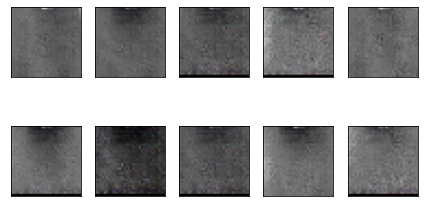

In [ ]:
encoder = load_model('/content/drive/MyDrive/enc1.h5', custom_objects={'Sampling': Sampling})
encoder.trainable = True  # unFreeze the encoder model
epochs = 100
batch_size = 64
smooth = 0.1
X_train = discriminator_data
real = np.ones(shape=(batch_size, 1))
fake = np.zeros(shape=(batch_size, 1))
d_loss = []
g_loss = []

for e in range(epochs + 1):
    for i in range(len(X_train) // batch_size):

        # Train Discriminator weights
        discriminator.trainable = True

        # Real samples
        X_batch = X_train[i*batch_size:(i+1)*batch_size]
        d_loss_real = discriminator.train_on_batch(x=X_batch,
                                                   y=real * (1 - smooth))

        # Fake Samples
        #z = np.random.normal(loc=0, scale=1, size=(batch_size, latent_dim))
        #tmp_z = encoder.predict(encoder_data[i*batch_size:(i+1)*batch_size])
        tmp_z = encoder(encoder_data[i*batch_size:(i+1)*batch_size])
        z = np.array(tmp_z)[2]
        #print(type(preds))
        #print(np.array(preds)[2].shape)
        X_fake = generator.predict_on_batch(z)
        d_loss_fake = discriminator.train_on_batch(x=X_fake, y=fake)

        # Discriminator loss
        d_loss_batch = 0.5 * (d_loss_real[0] + d_loss_fake[0])

        # Train Generator weights
        discriminator.trainable = False
        g_loss_batch = d_g.train_on_batch(x=z, y=real)

        print(
            'epoch = %d/%d, batch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, i, len(X_train) // batch_size, d_loss_batch, g_loss_batch[0]),
            100*' ',
            end='\r'
        )

    d_loss.append(d_loss_batch)
    g_loss.append(g_loss_batch[0])
    print('epoch = %d/%d, d_loss=%.5f, g_loss=%.5f' % (e + 1, epochs, d_loss[-1], g_loss[-1]), 100*' ')

    if e % 5 == 0:
        samples = 10
        #x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))
        tmp_z = encoder.predict(encoder_data[:samples])
        z = np.array(tmp_z)[2]
        x_fake = generator.predict(z)

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))
            #plt.imshow(x_fake[k].astype('uint8'), cmap='gray')

        plt.tight_layout()
        plt.show()

In [ ]:
generator.save('/content/drive/MyDrive/gen4.h5')
encoder.save('/content/drive/MyDrive/enc4.h5')

In [ ]:
!wget https://github.com/juhuyan/CrackDataset_DL_HY/archive/refs/heads/master.zip

--2023-02-25 12:48:17--  https://github.com/juhuyan/CrackDataset_DL_HY/archive/refs/heads/master.zip
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/juhuyan/CrackDataset_DL_HY/zip/refs/heads/master [following]
--2023-02-25 12:48:17--  https://codeload.github.com/juhuyan/CrackDataset_DL_HY/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.112.10
Connecting to codeload.github.com (codeload.github.com)|140.82.112.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [         <=>        ]   1.80G  18.8MB/s    in 90s     

2023-02-25 12:49:48 (20.4 MB/s) - ‘master.zip’ saved [1931308793]



In [ ]:
!unzip '/content/master.zip'

Streaming output truncated to the last 5000 lines.
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091001465-006302-006302_258.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091001465-006302-006302_260.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091002717-006314-006314_262.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091002717-006314-006314_263.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091002717-006314-006314_264.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091002717-006314-006314_265.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091002717-006314-006314_266.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/xml/091004586-006332-006332_287.xml  
  inflating: CrackDataset_DL_HY-master/BoxLevel_Detection/All

In [ ]:
!pip install pycocotools --quiet
!git clone https://github.com/pytorch/vision.git
!git checkout v0.3.0

!cp vision/references/detection/utils.py ./
!cp vision/references/detection/transforms.py ./
!cp vision/references/detection/coco_eval.py ./
!cp vision/references/detection/engine.py ./
!cp vision/references/detection/coco_utils.py ./

Cloning into 'vision'...
remote: Enumerating objects: 305932, done.
remote: Counting objects: 100% (689/689), done.
remote: Compressing objects: 100% (628/628), done.
remote: Total 305932 (delta 584), reused 128 (delta 57), pack-reused 305243
Receiving objects: 100% (305932/305932), 624.52 MiB | 37.70 MiB/s, done.
Resolving deltas: 100% (280722/280722), done.
fatal: not a git repository (or any of the parent directories): .git


In [ ]:
import os
import random
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import cv2
from xml.etree import ElementTree as et
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torchvision
from torchvision import transforms as torchtrans
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from engine import train_one_epoch, evaluate
import utils
import transforms as T
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

In [ ]:
def file_names(files_dir, use_augmented):
  if use_augmented == True:
    imgs = [image for image in sorted(os.listdir(files_dir+'images')) if image[-4:]=='.jpg' or image[-4:]=='.JPG']
  else:
    imgs = [image for image in sorted(os.listdir(files_dir+'images')) if image[-4:]=='.jpg']
  xmls = [xml for xml in sorted(os.listdir(files_dir+'xml')) if xml[-4:]=='.xml']
  images = []
  for i in range(0,len(imgs)):
    img_name = imgs[i][:-4]
    img_ext = imgs[i][-4:]
    for j in range(0,len(xmls)):
      xml_name = xmls[j][:-4]
      if xml_name == img_name :
        images.append(img_name+img_ext)
  return images, xmls

In [ ]:
class CrackImagesDataset(torch.utils.data.Dataset):

    def __init__(self, files_dir, width, height,imgs, xmls):
        self.files_dir = files_dir
        self.height = height
        self.images = imgs
        self.xmls = xmls
        self.width = width

    def __getitem__(self, idx):

        img_name = self.images[idx]
        image_path = os.path.join(self.files_dir+'images', img_name)
        img = cv2.imread(image_path)
        img_res = cv2.resize(img, (self.width, self.height))
        img_res = img_res.astype(np.float32)
        img_res /= 255.0

        # annotation file
        annot_filename = self.xmls[idx]
        annot_file_path = self.files_dir +'xml'+'/' + annot_filename
        boxes = []
        labels = []
        falses = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()
        # cv2 image gives size as height x width
        wt = img.shape[1]
        ht = img.shape[0]

        # box coordinates for xml files are extracted and corrected for image size given
        for member in root.findall('object'):
            label_name = member.find('name').text
            if label_name == 'alligator':
              labels.append(1)
            elif label_name == 'longitudinal':
              labels.append(2)
            elif label_name == 'sealed':
              labels.append(3)
            elif label_name == 'transverse' or label_name == 'transeverse':
              labels.append(4)

            # bounding box
            xmin = int(member.find('bndbox').find('xmin').text)
            xmax = int(member.find('bndbox').find('xmax').text)
            ymin = int(member.find('bndbox').find('ymin').text)
            ymax = int(member.find('bndbox').find('ymax').text)

            xmin_corr = (xmin/wt)*self.width
            xmax_corr = (xmax/wt)*self.width
            ymin_corr = (ymin/ht)*self.height
            ymax_corr = (ymax/ht)*self.height

            boxes.append([xmin_corr, ymin_corr, xmax_corr, ymax_corr])
            if len(boxes) == 0:
              falses.append(annot_file_path)
        # convert boxes into a torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # getting the areas of the boxes
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # suppose all instances are not crowd
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)

        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        return torch.tensor(np.ascontiguousarray(np.transpose(img_res, (2, 0, 1)))), target

    def __len__(self):
        return len(self.images)

In [ ]:
def get_correct_data(images, xmls):
  correct_annot_paths = []
  correct_img_paths = []
  for j in range(0,len(xmls)):
    img_name = images[j]
    image_path = os.path.join(files_dir+'images', img_name)
    img = cv2.imread(image_path)
    img_res = cv2.resize(img, (1280, 960))
    img_res = img_res.astype(float)
    img_res /= 255.0
    wt = img.shape[1]
    ht = img.shape[0]
    annot_path = files_dir+'xml'+'/'+xmls[j]
    tree = et.parse(annot_path)
    root = tree.getroot()
    flag = False
    for member in root.findall('object'):
      flag = True
      xmin = int(member.find('bndbox').find('xmin').text)
      xmax = int(member.find('bndbox').find('xmax').text)
      ymin = int(member.find('bndbox').find('ymin').text)
      ymax = int(member.find('bndbox').find('ymax').text)
    if flag == True:
      correct_annot_paths.append(annot_path.split('/')[-1])
      correct_img_paths.append(image_path.split('/')[-1])
  return correct_img_paths, correct_annot_paths

#files_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/LongitudinalCrack/'
#files_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/TransverseCrack/'
#files_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/'
files_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/SealedCrack/'
use_aug = True
images, xmls = file_names(files_dir, use_aug)
correct_img_paths, correct_annot_paths = get_correct_data(images, xmls)
print(len(correct_img_paths))
print((correct_annot_paths))
print((correct_img_paths))
print(len(correct_annot_paths))

329
['020000.xml', '020001.xml', '020002.xml', '020003.xml', '020004.xml', '020005.xml', '020006.xml', '020007.xml', '020008.xml', '020010.xml', '020011.xml', '020012.xml', '020013.xml', '020015.xml', '020016.xml', '020017.xml', '020018.xml', '020020.xml', '020022.xml', '020023.xml', '020026.xml', '020030.xml', '020033.xml', '020034.xml', '020038.xml', '020039.xml', '020041.xml', '020043.xml', '020044.xml', '020046.xml', '020047.xml', '020048.xml', '020049.xml', '020054.xml', '020056.xml', '020058.xml', '020060.xml', '020064.xml', '020066.xml', '020072.xml', '020073.xml', '020078.xml', '020083.xml', '020086.xml', '020088.xml', '020089.xml', '020090.xml', '020093.xml', '020098.xml', '020099.xml', '020100.xml', '020102.xml', '020103.xml', '020106.xml', '020107.xml', '020108.xml', '020110.xml', '020112.xml', '020113.xml', '020116.xml', '020117.xml', '020122.xml', '020128.xml', '020132.xml', '020134.xml', '020135.xml', '020139.xml', '020140.xml', '020142.xml', '020143.xml', '020144.xml', '

In [ ]:
LongitudinalCrack_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/LongitudinalCrack/'
#images, xmls = file_names(LongitudinalCrack_dir)
#correct_img_paths, correct_annot_paths = get_correct_data(images, xmls)
LongitudinalCrack = CrackImagesDataset(LongitudinalCrack_dir, imgs = correct_img_paths, xmls = correct_annot_paths,
                                       width=224, height = 224)

print('length of dataset = ', len(LongitudinalCrack), '\n')
img, target = LongitudinalCrack[1]
print(img.shape, '\n',target)

length of dataset =  508 

torch.Size([3, 224, 224]) 
 {'boxes': tensor([[ 30.1000,   0.4667,  40.4250, 223.5333]]), 'labels': tensor([2]), 'area': tensor([2303.1633]), 'iscrowd': tensor([0]), 'image_id': tensor([1])}


In [ ]:
TransverseCrack_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/TransverseCrack/'
#images, xmls = file_names(TransverseCrack_dir)
#correct_img_paths, correct_annot_paths = get_correct_data(images, xmls)
TransverseCrack = CrackImagesDataset(TransverseCrack_dir, imgs = correct_img_paths, xmls = correct_annot_paths,
                                       width=224, height = 224)

print('length of dataset = ', len(TransverseCrack), '\n')
img, target = TransverseCrack[1]
print(img.shape, '\n',target)

length of dataset =  953 

torch.Size([3, 224, 224]) 
 {'boxes': tensor([[126.3500,  27.0667, 222.2500,  49.0000],
        [  0.3500,   1.8667,  67.2000,  30.3333]]), 'labels': tensor([4, 4]), 'area': tensor([2103.4065, 1902.9967]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([1])}


In [ ]:
AlligatorCrack_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/AlligatorCrack/'
#images, xmls = file_names(AlligatorCrack_dir)
#correct_img_paths, correct_annot_paths = get_correct_data(images, xmls)
AlligatorCrack = CrackImagesDataset(AlligatorCrack_dir, imgs = correct_img_paths, xmls = correct_annot_paths,
                                       width=224, height = 224)
print('length of dataset = ', len(AlligatorCrack), '\n')
img, target = AlligatorCrack[1]
print(img.shape, '\n',target)

length of dataset =  450 

torch.Size([3, 224, 224]) 
 {'boxes': tensor([[  0.3500,   0.0000, 198.9750, 222.8333]]), 'labels': tensor([1]), 'area': tensor([44260.2695]), 'iscrowd': tensor([0]), 'image_id': tensor([1])}


In [ ]:
SealedCrack_dir = '/content/CrackDataset_DL_HY-master/BoxLevel_Detection/SealedCrack/'
#images, xmls = file_names(SealedCrack_dir)
#correct_img_paths, correct_annot_paths = get_correct_data(images, xmls)
SealedCrack = CrackImagesDataset(SealedCrack_dir, imgs = correct_img_paths, xmls = correct_annot_paths,
                                       width=224, height = 224)

print('length of dataset = ', len(SealedCrack), '\n')
img, target = SealedCrack[1]
print(img.shape, '\n',target)

length of dataset =  329 

torch.Size([3, 224, 224]) 
 {'boxes': tensor([[154.3500,   0.4667, 196.7000,  93.5667]]), 'labels': tensor([3]), 'area': tensor([3942.7842]), 'iscrowd': tensor([0]), 'image_id': tensor([1])}


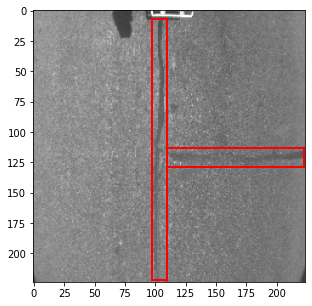

In [ ]:
def plot_img_bbox(img, target):
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    img = img.numpy()
    img = np.ascontiguousarray(np.transpose(img, (1, 2, 0)))
    a.imshow(img)

    for box in (target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        a.add_patch(rect)
    plt.show()

img, target = SealedCrack[50]
plot_img_bbox(img, target)

In [ ]:
def get_object_detection_model(num_classes):

    # load a model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [ ]:
train_dev_sets = torch.utils.data.ConcatDataset([AlligatorCrack, LongitudinalCrack, SealedCrack, TransverseCrack])
print(len(train_dev_sets))
img , tar = train_dev_sets[0]
print(img.shape)
print(tar)

2240
torch.Size([3, 224, 224])
{'boxes': tensor([[  6.3000, 119.9333, 157.1500, 217.9333],
        [107.1000,  11.6667, 181.6500, 113.4000]]), 'labels': tensor([1, 1]), 'area': tensor([14783.2988,  7584.2197]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}


In [ ]:
# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(train_dev_sets)).tolist()

test_split = 0.15
tsize = int(len(train_dev_sets)*test_split)
dataset = torch.utils.data.Subset(train_dev_sets, indices[:-tsize])
dataset_test = torch.utils.data.Subset(train_dev_sets, indices[-tsize:])
print(len(dataset))
print(len(dataset_test))

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=16, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=16, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

1904
336


In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)
num_classes = 5

model = get_object_detection_model(num_classes)
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

cuda


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

Training Faster-RCNN with augmented dataset

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=5)
    lr_scheduler.step()
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/44]  eta: 0:01:12  lr: 0.000121  loss: 1.3629 (1.3629)  loss_classifier: 1.2209 (1.2209)  loss_box_reg: 0.1307 (0.1307)  loss_objectness: 0.0064 (0.0064)  loss_rpn_box_reg: 0.0049 (0.0049)  time: 1.6391  data: 0.4889  max mem: 11686
Epoch: [0]  [ 5/44]  eta: 0:00:40  lr: 0.000702  loss: 1.2906 (1.2164)  loss_classifier: 1.0320 (0.9681)  loss_box_reg: 0.2494 (0.2393)  loss_objectness: 0.0024 (0.0039)  loss_rpn_box_reg: 0.0050 (0.0051)  time: 1.0388  data: 0.1024  max mem: 11686
Epoch: [0]  [10/44]  eta: 0:00:33  lr: 0.001283  loss: 0.9010 (0.9687)  loss_classifier: 0.4806 (0.6881)  loss_box_reg: 0.2631 (0.2673)  loss_objectness: 0.0036 (0.0076)  loss_rpn_box_reg: 0.0050 (0.0057)  time: 0.9740  data: 0.0591  max mem: 11686
Epoch: [0]  [15/44]  eta: 0:00:27  lr: 0.001864  loss: 0.7414 (0.8954)  loss_classifier: 0.4411 (0.6081)  loss_box_reg: 0.2631 (0.2748)  loss_objectness: 0.0044 (0.0070)  loss_rpn_box_reg: 0.0049 (0.0056)  time: 0.9529  data: 0.0456  max mem: 11686
Epoc

Training Faster-RCNN with real data (no augmentation)

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=5)
    lr_scheduler.step()
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/44]  eta: 0:01:44  lr: 0.000121  loss: 1.6010 (1.6010)  loss_classifier: 1.2766 (1.2766)  loss_box_reg: 0.3118 (0.3118)  loss_objectness: 0.0017 (0.0017)  loss_rpn_box_reg: 0.0109 (0.0109)  time: 2.3747  data: 1.2733  max mem: 11686
Epoch: [0]  [ 5/44]  eta: 0:00:45  lr: 0.000702  loss: 1.3530 (1.3064)  loss_classifier: 0.9734 (0.9864)  loss_box_reg: 0.3086 (0.3072)  loss_objectness: 0.0010 (0.0065)  loss_rpn_box_reg: 0.0052 (0.0063)  time: 1.1756  data: 0.2259  max mem: 11686
Epoch: [0]  [10/44]  eta: 0:00:35  lr: 0.001283  loss: 0.9910 (1.0257)  loss_classifier: 0.6241 (0.7038)  loss_box_reg: 0.3086 (0.3090)  loss_objectness: 0.0020 (0.0060)  loss_rpn_box_reg: 0.0063 (0.0069)  time: 1.0546  data: 0.1283  max mem: 11686
Epoch: [0]  [15/44]  eta: 0:00:29  lr: 0.001864  loss: 0.7435 (0.9163)  loss_classifier: 0.4214 (0.6028)  loss_box_reg: 0.3015 (0.3007)  loss_objectness: 0.0024 (0.0057)  loss_rpn_box_reg: 0.0063 (0.0070)  time: 1.0197  data: 0.0946  max mem: 11686
Epoc

In [ ]:
def apply_nms(orig_prediction, iou_thresh=0.3):

    # torchvision returns the indices of the bboxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)

    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]

    return final_prediction

# function to convert a torchtensor back to PIL image
def torch_to_pil(img):
    return torchtrans.ToPILImage()(img).convert('RGB')

In [ ]:
# pick one image from the test set
img, target = dataset_test[89]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]

print('predicted #boxes: ', len(prediction['labels']))
print('real #boxes: ', len(target['labels']))

predicted #boxes:  8
real #boxes:  1


EXPECTED OUTPUT


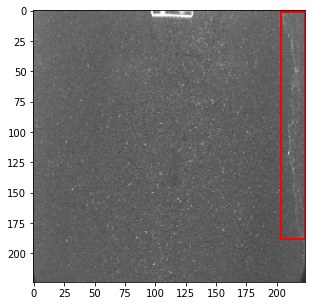

In [ ]:
print('EXPECTED OUTPUT')
plot_img_bbox((img), target)

In [ ]:
def to_cpu(dict_pred):
  final_prediction = {}
  final_prediction['boxes'] = dict_pred['boxes'].cpu()
  final_prediction['scores'] = dict_pred['scores'].cpu()
  final_prediction['labels'] = dict_pred['labels'].cpu()
  return final_prediction

MODEL OUTPUT


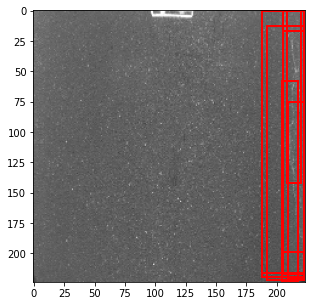

In [ ]:
print('MODEL OUTPUT')
plot_img_bbox((img), to_cpu(prediction))

{'boxes': tensor([[205.1387,   0.0000, 222.5920, 198.7061]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'scores': tensor([0.4985], device='cuda:0')}
NMS APPLIED MODEL OUTPUT


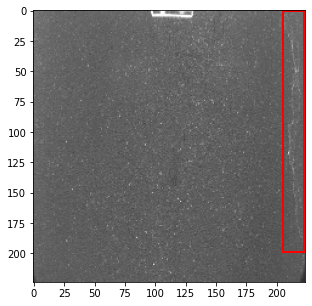

In [ ]:
nms_prediction = apply_nms(prediction, iou_thresh=0.2)
print(nms_prediction)
print('NMS APPLIED MODEL OUTPUT')
plot_img_bbox((img), to_cpu(nms_prediction))

EXPECTED OUTPUT



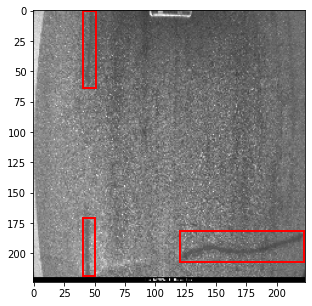

MODEL OUTPUT



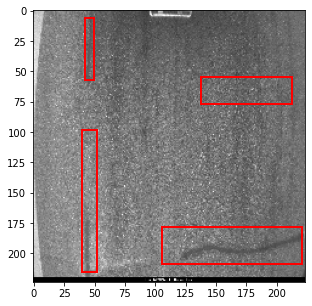

In [ ]:
img, target = dataset_test[13]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]

print('EXPECTED OUTPUT\n')
plot_img_bbox((img), target)
print('MODEL OUTPUT\n')
nms_prediction = apply_nms(prediction, iou_thresh=0.01)

plot_img_bbox((img), to_cpu(nms_prediction))

In [ ]:
torch.save(model, '/content/drive/MyDrive/faster_rcnn')
#model = torch.load('/content/drive/MyDrive/faster_rcnn')